In [2]:
import sys
import os
sys.path.append("../utils")
sys.path.append("../dataloader")
from plot_utils import plot_spatial
from sklearn.metrics import r2_score
import numpy as np

In [3]:
import numpy as np
def get_min_max_coords(mask, pad):
    min_x = np.min(np.where(mask)[0])
    max_x = np.max(np.where(mask)[0])
    min_y = np.min(np.where(mask)[1])
    max_y = np.max(np.where(mask)[1])
    # wid_x = math.ceil((max_x - min_x)/2)*2
    # wid_y = math.floor((max_y - min_y)/2)*2
    # return int(min_x-pad), int(min_x+wid_x+pad), \
    #     int(min_y-pad), int(min_y+wid_y+pad)
    return min_x-pad, max_x+pad, min_y-pad, max_y+pad

In [7]:
all_avg_pred = {
    "avg_pred_conv":  np.load("ex_qtend_conv_memory_avg_pred.npy"),
    "avg_pred_avail": np.load("ex_qtend_conv_memory_availinput_avg_pred.npy"),
    "avg_pred_avail_cape": np.load("ex_qtend_conv_memory_availinput+cape_avg_pred.npy"),
    "avg_pred_avail_prec": np.load("ex_qtend_conv_memory_availinput+spprecc_avg_pred.npy"),
    "avg_pred_avail_cloud": np.load("ex_qtend_conv_memory_availinput+cloud_avg_pred.npy"),
    "avg_pred_allinput": np.load("ex_qtend_conv_memory_allinput_avg_pred.npy"),
    "avg_gt": np.load("vae_analysis_ckpts/comb_vae_twp/offline_test_ae_avg_gt.npy"),
}

In [8]:
mean = np.load("../analysis/test_data/data_means.npz")["qtend_check"]
std = np.load("../analysis/test_data/data_stds.npz")["qtend_check"]

In [9]:
for key in all_avg_pred:
    all_avg_pred[key] = all_avg_pred[key]*std + mean

In [10]:
mask = np.load("../consts/twp_region.npy")
min_x, max_x, min_y, max_y = get_min_max_coords(mask, 0)

In [11]:
print(mask.sum())

1442.0


In [12]:
lon = np.linspace(0,357.5,144)
lat = np.linspace(-90,90,96)

In [13]:
levs = np.array([
    3.64346569,   7.59481965,  14.35663225,  24.61222,     38.26829977,
      54.59547974,  72.01245055,  87.82123029, 103.31712663, 121.54724076,
       142.99403876, 168.22507977, 197.9080867,  232.82861896, 273.91081676,
        322.24190235, 379.10090387, 445.9925741,  524.68717471, 609.77869481,
         691.38943031, 763.40448111, 820.85836865, 859.53476653, 887.02024892,
          912.64454694, 936.19839847, 957.48547954, 976.32540739, 992.55609512]).astype(int)


1.9326170697969146e-08 -1.0909638893097413e-08


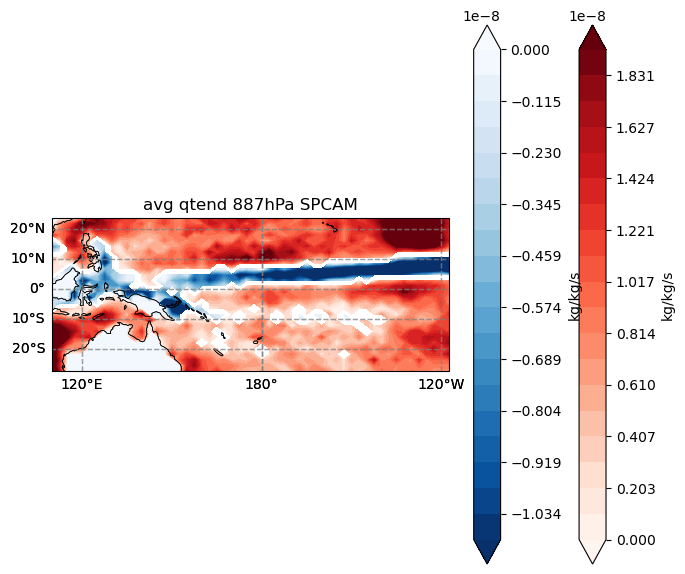

1.750353330062459e-08 -3.146449811888266e-09


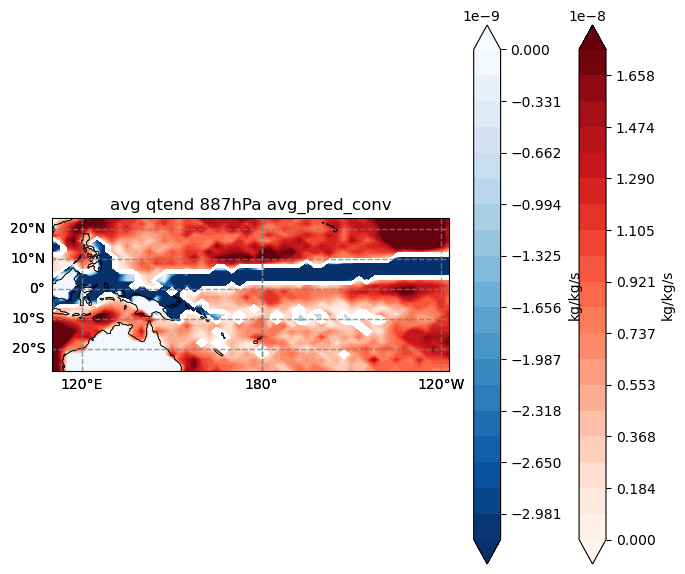

1.5397167907407185e-08 -4.866438974095991e-09


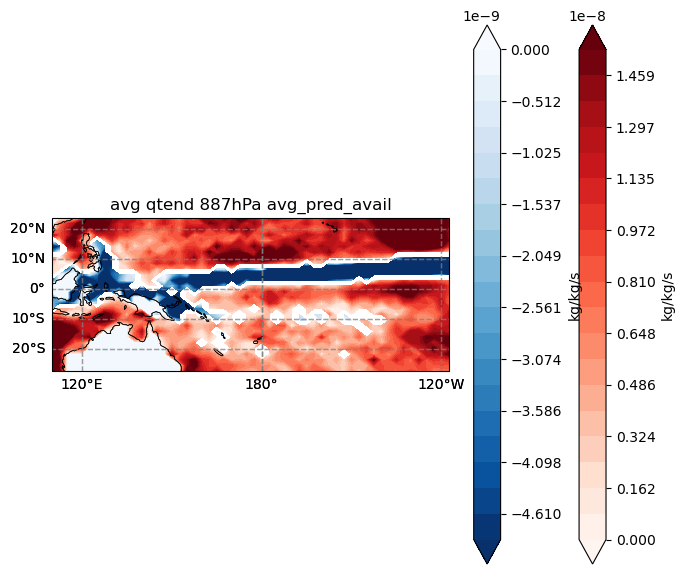

1.581244603040765e-08 -3.802589831982664e-09


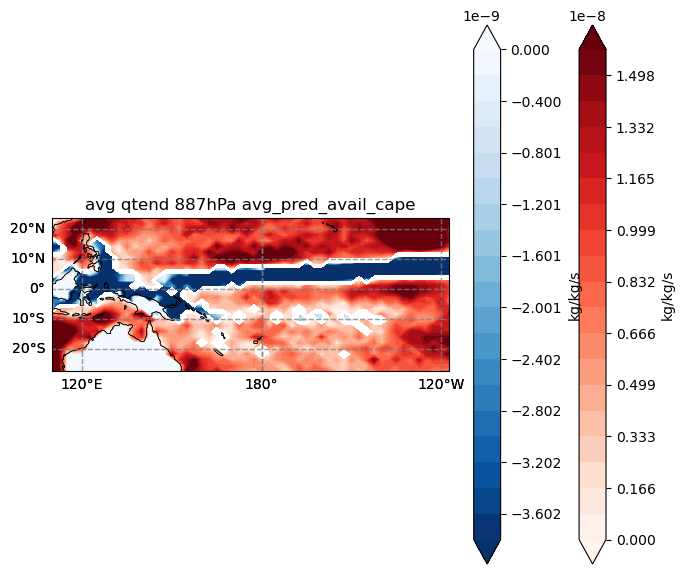

1.2561178863803604e-08 -5.41038208687005e-09


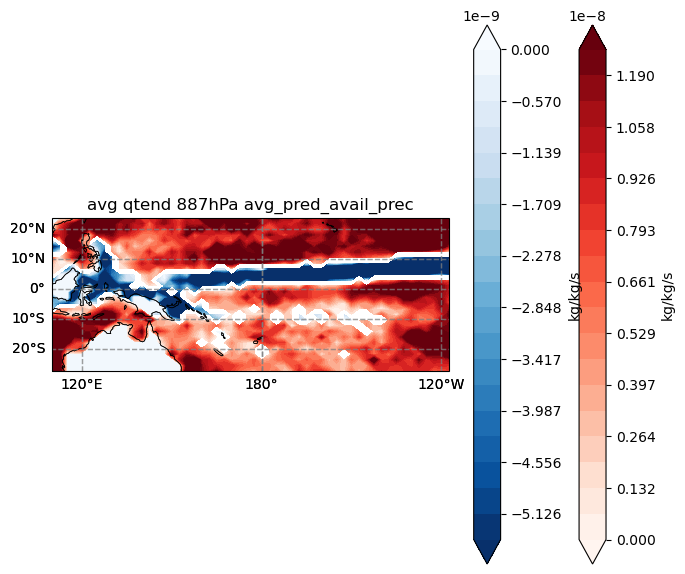

1.5695320343480637e-08 -3.793309477719822e-09


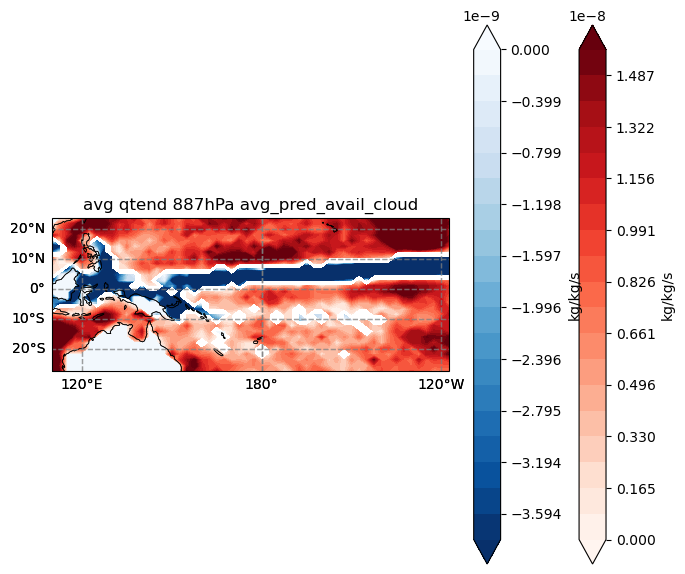

1.3980437352314463e-08 -4.792232888375373e-09


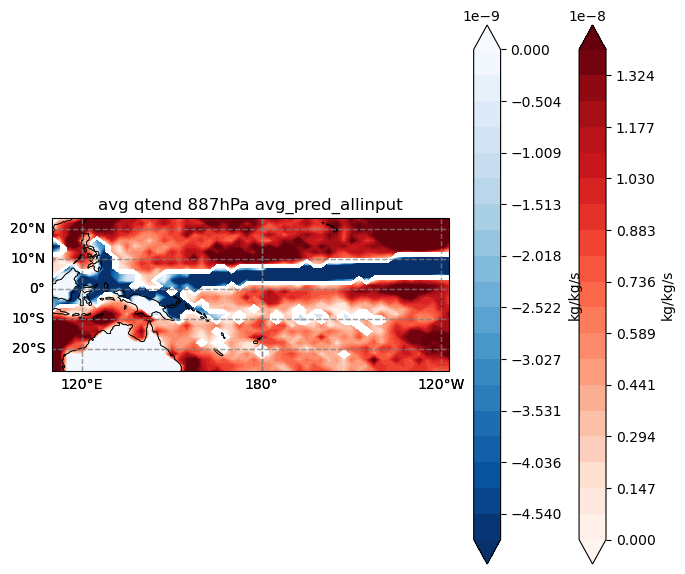

In [22]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from matplotlib.ticker import FuncFormatter
one_decimal_formatter = FuncFormatter(lambda x, _: f'{x:.1e}')
for i in range(24,25):
    gt = np.zeros((mask.shape))
    gt[mask.astype(bool)] = all_avg_pred["avg_gt"][:,i]
    # pred_resmlp = np.zeros((mask.shape))
    # pred_resmlp[mask.astype(bool)] = avg_pred_resmlp2[:,i]
    fig, ax = plt.subplots(1,1, figsize=(8,10), subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)})
    cbar_label = "kg/kg/s"
    ax.set_title(f"avg qtend {levs[i]}hPa SPCAM")
    vmax = np.quantile(all_avg_pred["avg_gt"][:,i], 0.95)+1e-16
    vmin = np.quantile(all_avg_pred["avg_gt"][:,i], 0.05)-1e-16
    print(vmax, vmin)
    gt_pos = gt.copy()
    gt_pos[gt_pos<0] = None
    gt_neg = gt.copy()
    gt_neg[gt_neg>0] = None
    if np.any(vmax > 0 and gt>0):
        plot_spatial(lon[min_y:max_y], lat[min_x:max_x], gt_pos[min_x:max_x,min_y:max_y],ax=ax, cbar_label=cbar_label, vmin=0, vmax=vmax, cmap="Reds", cbar_formatter=one_decimal_formatter)
    if np.any(vmin < 0 and gt<0):
        plot_spatial(lon[min_y:max_y], lat[min_x:max_x], gt_neg[min_x:max_x,min_y:max_y],ax=ax, cbar_label=cbar_label, vmin=vmin, vmax=0, cmap="Blues_r", cbar_formatter=one_decimal_formatter)
    plt.show()
    for key in all_avg_pred:
        if key == "avg_gt":
            continue
        pred = np.zeros((mask.shape))
        pred[mask.astype(bool)] = all_avg_pred[key][:,i]
        # pred_resmlp = np.zeros((mask.shape))
        # pred_resmlp[mask.astype(bool)] = avg_pred_resmlp2[:,i]
        fig, ax = plt.subplots(1,1, figsize=(8,10), subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)})
        cbar_label = "kg/kg/s"
        ax.set_title(f"avg qtend {levs[i]}hPa {key}")
        vmax = np.quantile(all_avg_pred[key][:,i], 0.95)+1e-16
        vmin = np.quantile(all_avg_pred[key][:,i], 0.05)-1e-16
        print(vmax, vmin)
        gt_pos = gt.copy()
        gt_pos[gt_pos<0] = None
        gt_neg = gt.copy()
        gt_neg[gt_neg>0] = None
        if np.any(vmax > 0 and gt>0):
            plot_spatial(lon[min_y:max_y], lat[min_x:max_x], gt_pos[min_x:max_x,min_y:max_y],ax=ax, cbar_label=cbar_label, vmin=0, vmax=vmax, cmap="Reds", cbar_formatter=one_decimal_formatter)
        if np.any(vmin < 0 and gt<0):
            plot_spatial(lon[min_y:max_y], lat[min_x:max_x], gt_neg[min_x:max_x,min_y:max_y],ax=ax, cbar_label=cbar_label, vmin=vmin, vmax=0, cmap="Blues_r", cbar_formatter=one_decimal_formatter)
        plt.show()

5.010770753118363e-16 3.0107707531183626e-16


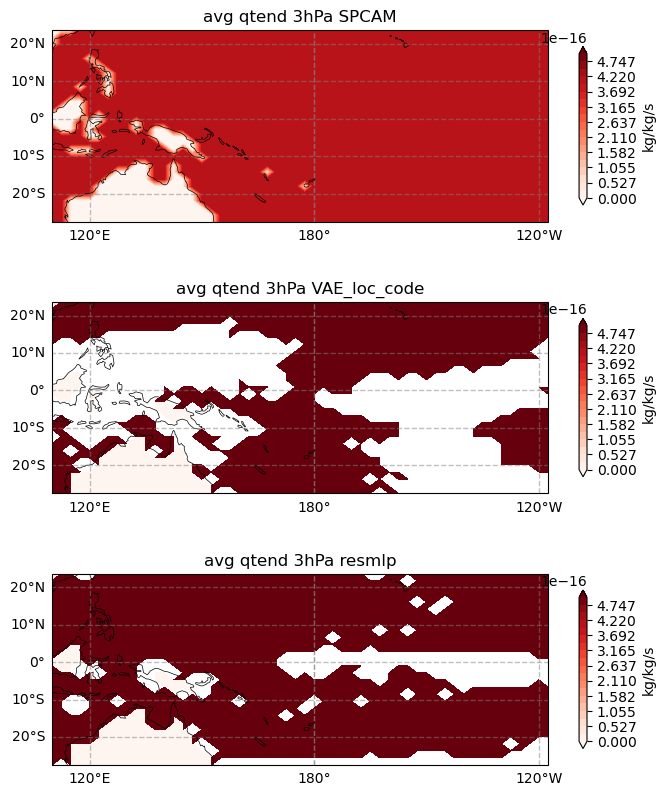

5.010770753118363e-16 3.0107707531183626e-16


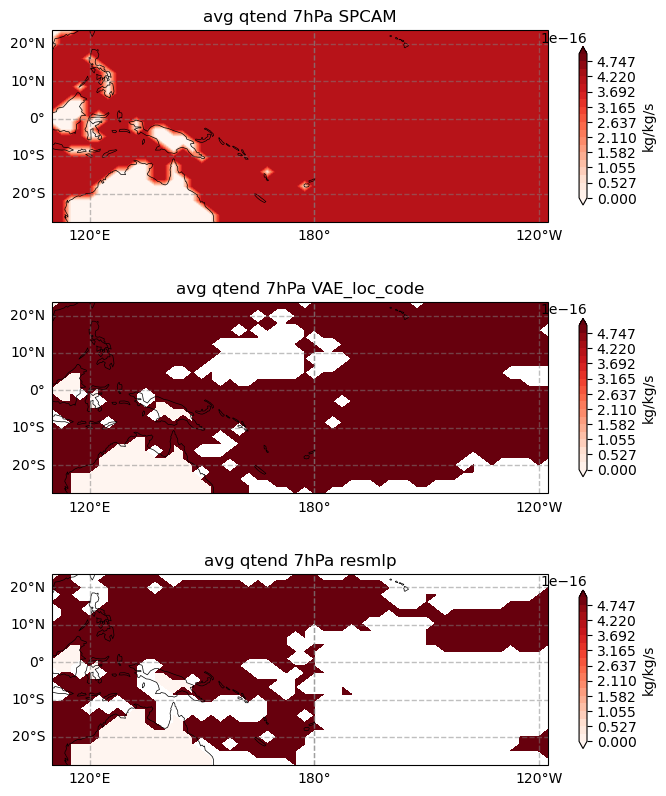

5.010770753118363e-16 3.0107707531183626e-16


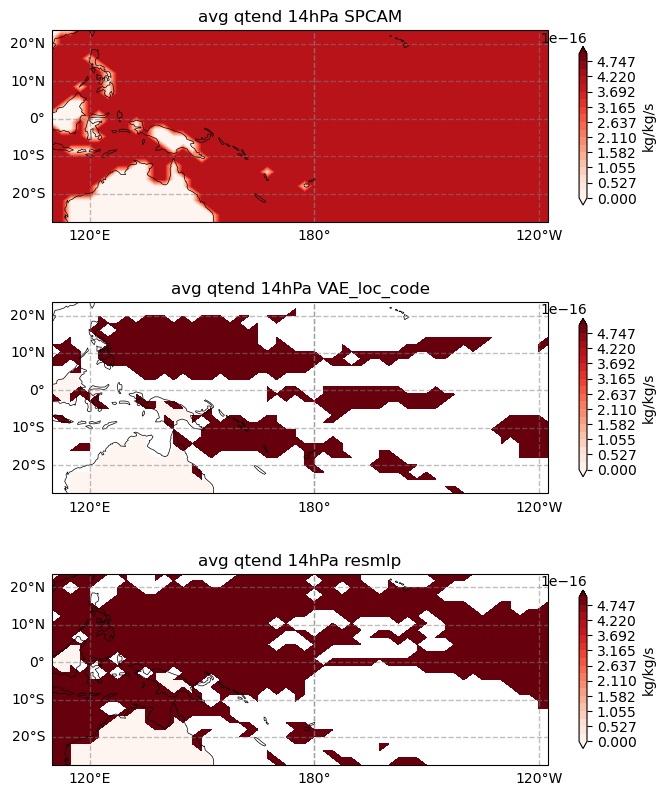

5.010770753118363e-16 3.0107707531183626e-16


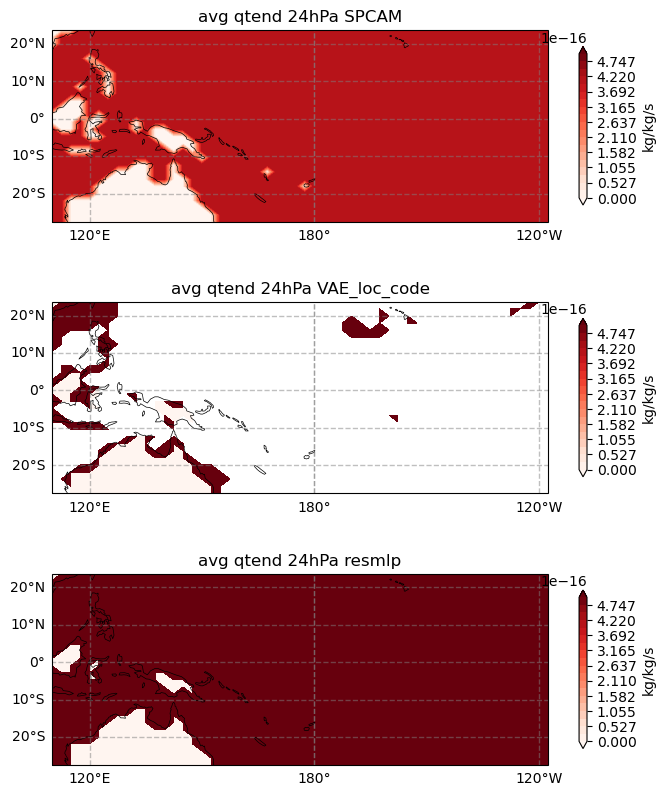

4.122208106366465e-14 -1.5977457404887513e-14


KeyboardInterrupt: 

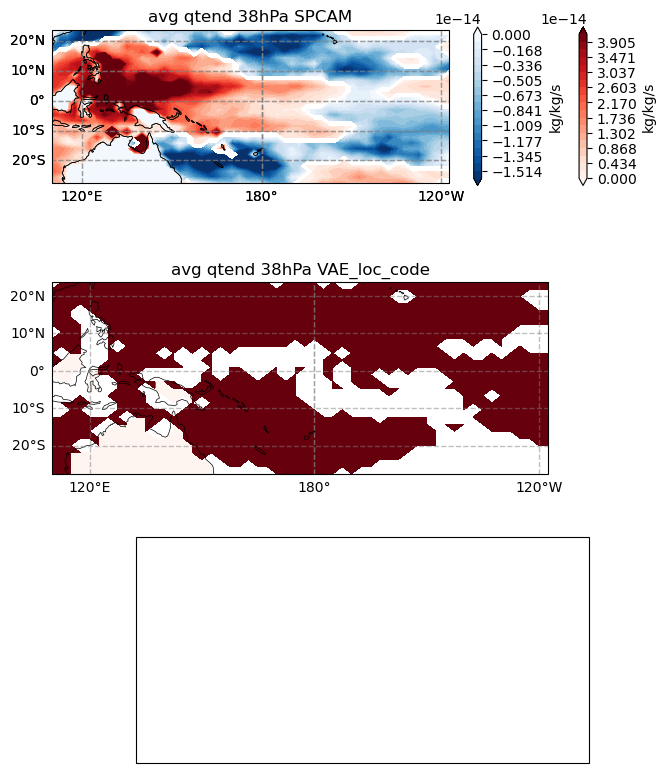

In [12]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from matplotlib.ticker import FuncFormatter
one_decimal_formatter = FuncFormatter(lambda x, _: f'{x:.1e}')
for i in range(30):
    pred = np.zeros((mask.shape))
    pred[mask.astype(bool)] = avg_pred[:,i]
    gt = np.zeros((mask.shape))
    gt[mask.astype(bool)] = avg_gt[:,i]
    pred_resmlp = np.zeros((mask.shape))
    pred_resmlp[mask.astype(bool)] = avg_pred_resmlp2[:,i]
    fig, ax = plt.subplots(3,1, figsize=(8,10), subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)})
    cbar_label = "kg/kg/s"
    ax[0].set_title(f"avg qtend {levs[i]}hPa SPCAM")
    vmax = np.quantile(avg_gt[:,i], 0.95)+1e-16
    vmin = np.quantile(avg_gt[:,i], 0.05)-1e-16
    print(vmax, vmin)
    gt_pos = gt.copy()
    gt_pos[gt_pos<0] = None
    gt_neg = gt.copy()
    gt_neg[gt_neg>0] = None
    if np.any(vmax > 0 and gt>0):
        plot_spatial(lon[min_y:max_y], lat[min_x:max_x], gt_pos[min_x:max_x,min_y:max_y],ax=ax[0], cbar_label=cbar_label, vmin=0, vmax=vmax, cmap="Reds", cbar_formatter=one_decimal_formatter)
    if np.any(vmin < 0 and gt<0):
        plot_spatial(lon[min_y:max_y], lat[min_x:max_x], gt_neg[min_x:max_x,min_y:max_y],ax=ax[0], cbar_label=cbar_label, vmin=vmin, vmax=0, cmap="Blues_r", cbar_formatter=one_decimal_formatter)
    ax[1].set_title(f"avg qtend {levs[i]}hPa VAE_loc_code")
    pred_pos = pred.copy()
    pred_pos[pred_pos<0] = None
    pred_neg = pred.copy()
    pred_neg[pred_neg>0] = None
    if np.any(vmax > 0 and pred>0):
        plot_spatial(lon[min_y:max_y], lat[min_x:max_x], pred_pos[min_x:max_x,min_y:max_y],ax=ax[1], cbar_label=cbar_label, vmin=0, vmax=vmax, cmap="Reds", cbar_formatter=one_decimal_formatter)
    if np.any(vmin < 0 and pred<0):
        plot_spatial(lon[min_y:max_y], lat[min_x:max_x], pred_neg[min_x:max_x,min_y:max_y],ax=ax[1], cbar_label=cbar_label, vmin=vmin, vmax=0, cmap="Blues_r", cbar_formatter=one_decimal_formatter)
    ax[2].set_title(f"avg qtend {levs[i]}hPa resmlp")
    pred_resmlp_pos = pred_resmlp.copy()
    pred_resmlp_pos[pred_resmlp_pos<0] = None
    pred_resmlp_neg = pred_resmlp.copy()
    pred_resmlp_neg[pred_resmlp_neg>0] = None
    #if np.any(vmax > 0 and pred_resmlp>0):
    if np.any(vmax > 0):
        plot_spatial(lon[min_y:max_y], lat[min_x:max_x], pred_resmlp_pos[min_x:max_x,min_y:max_y],ax=ax[2], cbar_label=cbar_label, vmin=0, vmax=vmax, cmap="Reds", cbar_formatter=one_decimal_formatter)
    #if np.any(vmin < 0 and pred_resmlp<0):
    if np.any(vmin < 0):
        plot_spatial(lon[min_y:max_y], lat[min_x:max_x], pred_resmlp_neg[min_x:max_x,min_y:max_y],ax=ax[2], cbar_label=cbar_label, vmin=vmin, vmax=0, cmap="Blues_r", cbar_formatter=one_decimal_formatter)
    plt.show()

4.296467592951595e-11 -9.365007892277446e-09


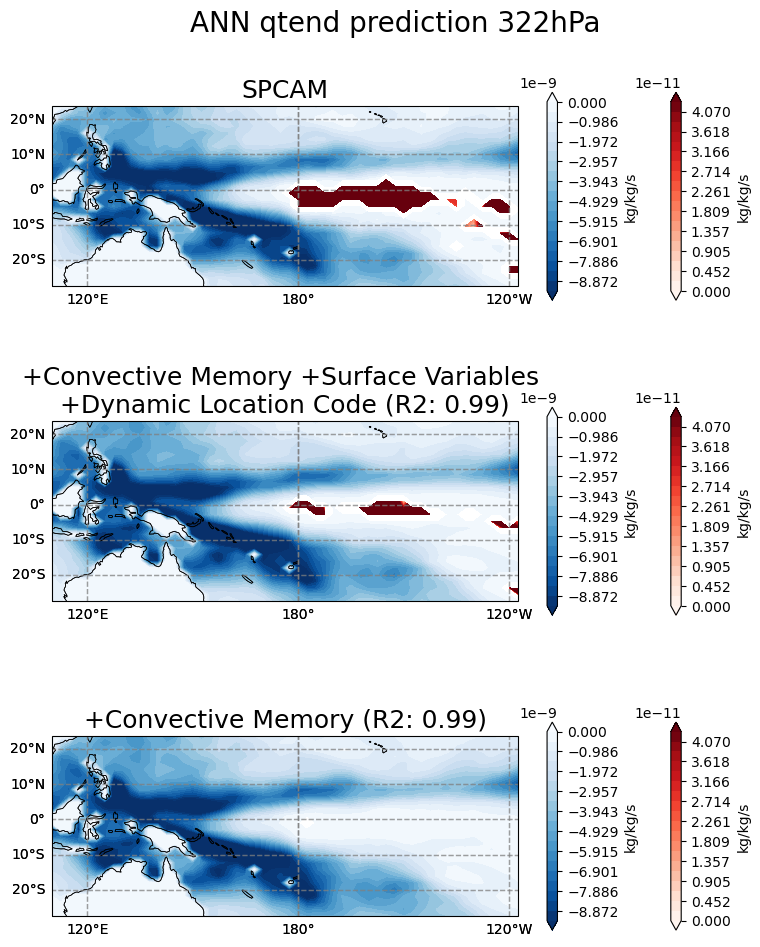

1.5223370974886842e-10 -1.172643890491554e-08


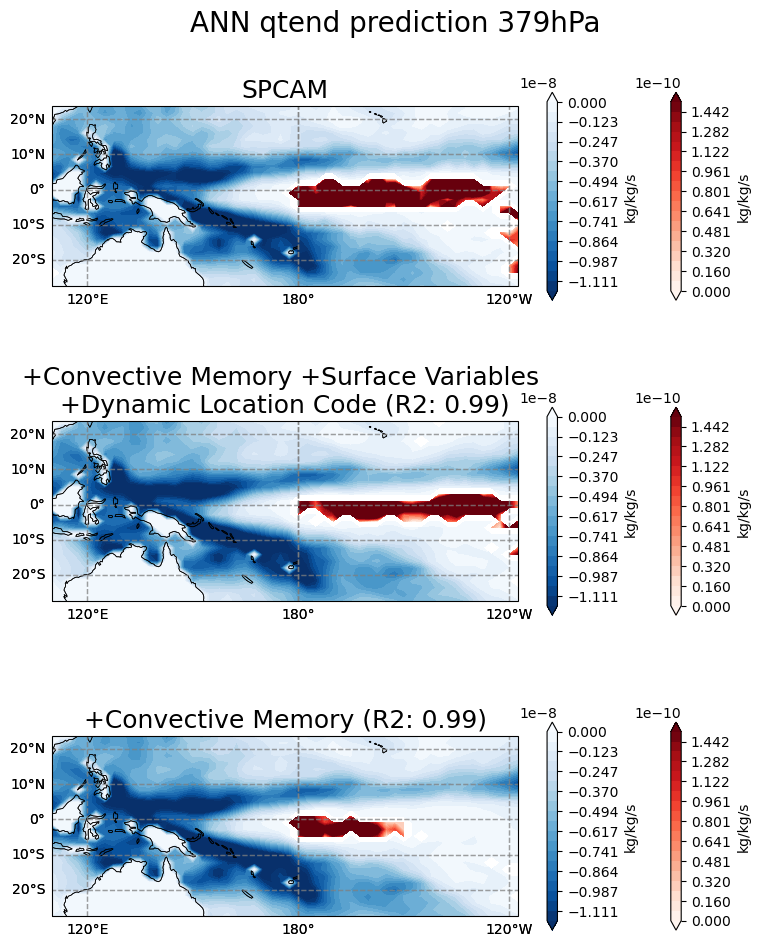

3.1783194280270726e-10 -1.1352714554228542e-08


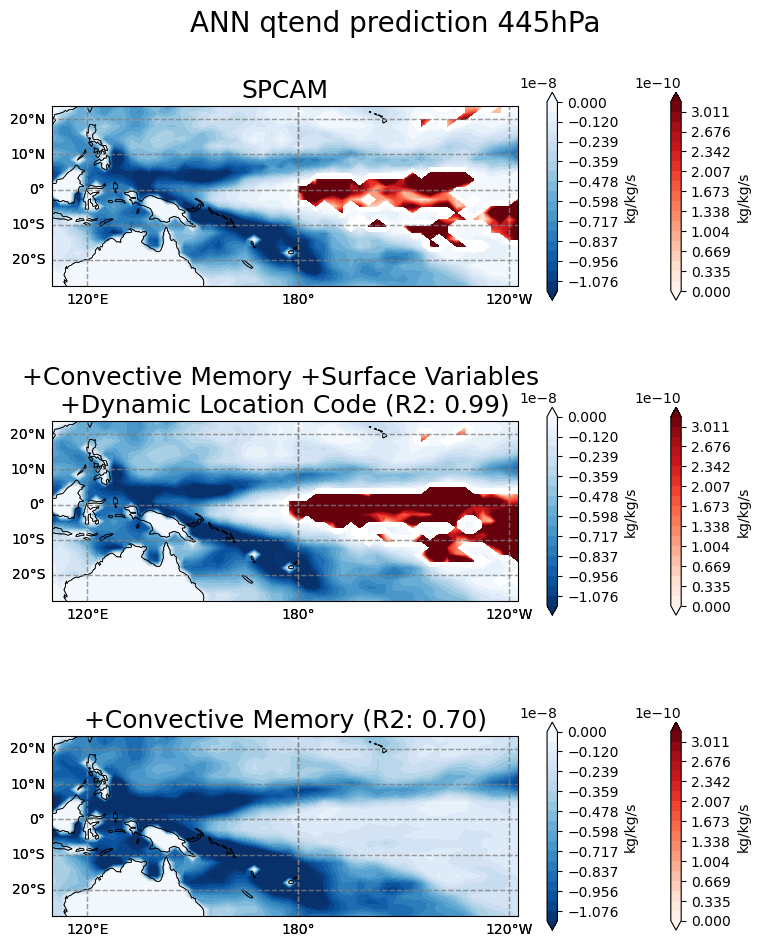

6.677309427586859e-10 -8.932466915493824e-09


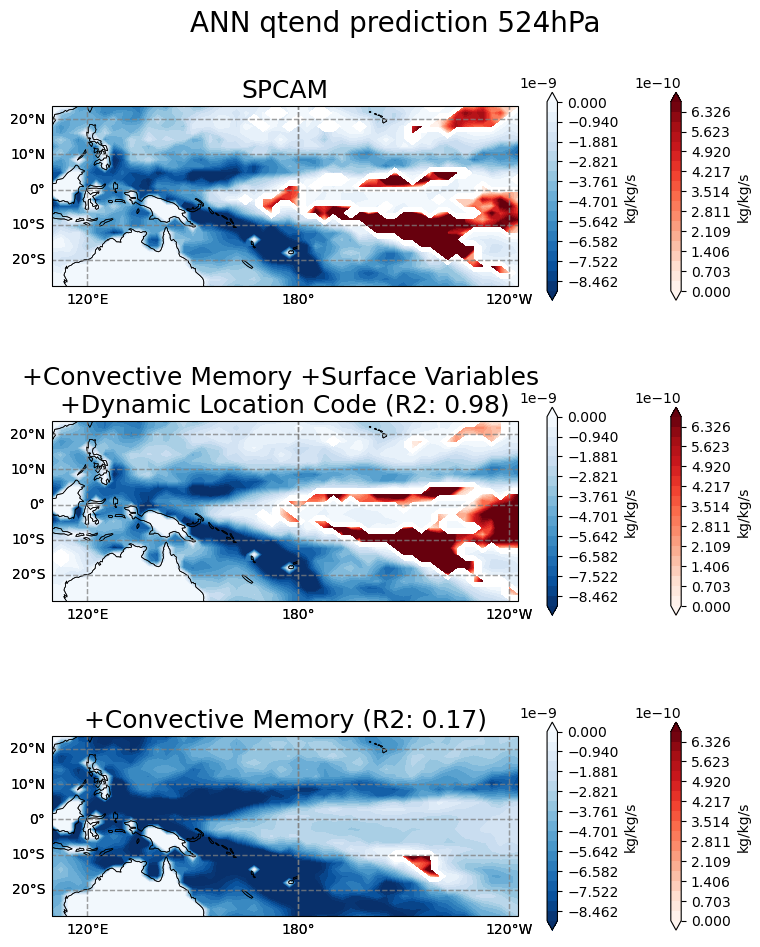

2.576560345711089e-09 -9.16969512734465e-09


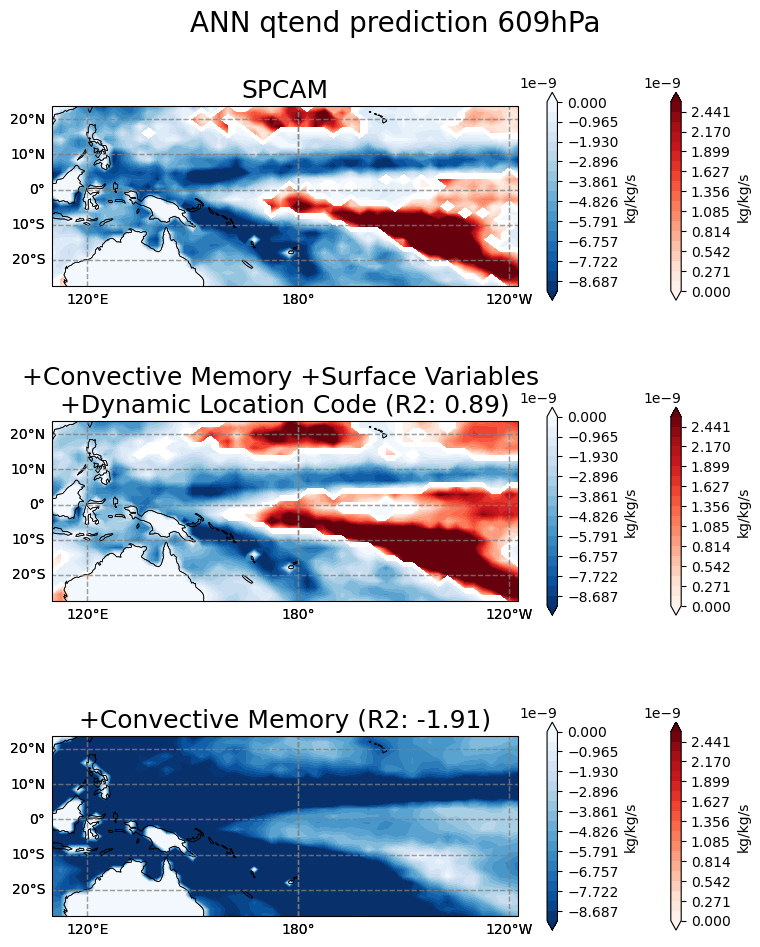

In [25]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from matplotlib.ticker import FuncFormatter
title_font = {
    # 'family': 'serif',
    'color': 'black',
    # 'weight': 'bold',
    'size': 18,
}
one_decimal_formatter = FuncFormatter(lambda x, _: f'{x:.1e}')
for i in range(15,20):
    pred = np.zeros((mask.shape))
    pred[mask.astype(bool)] = avg_pred[:,i]
    gt = np.zeros((mask.shape))
    gt[mask.astype(bool)] = avg_gt[:,i]
    pred_resmlp = np.zeros((mask.shape))
    pred_resmlp[mask.astype(bool)] = avg_pred_resmlp[:,i]
    fig, ax = plt.subplots(3,1, figsize=(8,10), subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)})
    fig.suptitle(f"ANN qtend prediction {levs[i]}hPa", fontdict=title_font, size=20)
    cbar_label = "kg/kg/s"
    ax[0].set_title(f"SPCAM", fontdict=title_font)
    vmax = np.quantile(avg_gt[:,i], 0.95)+1e-16
    vmin = np.quantile(avg_gt[:,i], 0.05)-1e-16
    print(vmax, vmin)
    gt_pos = gt.copy()
    gt_pos[gt_pos<0] = None
    gt_neg = gt.copy()
    gt_neg[gt_neg>0] = None
    if np.any(vmax > 0 and gt>0):
        plot_spatial(lon[min_y:max_y], lat[min_x:max_x], gt_pos[min_x:max_x,min_y:max_y],ax=ax[0], cbar_label=cbar_label, vmin=0, vmax=vmax, cmap="Reds", cbar_formatter=one_decimal_formatter)
    if np.any(vmin < 0 and gt<0):
        plot_spatial(lon[min_y:max_y], lat[min_x:max_x], gt_neg[min_x:max_x,min_y:max_y],ax=ax[0], cbar_label=cbar_label, vmin=vmin, vmax=0, cmap="Blues_r", cbar_formatter=one_decimal_formatter)
    ax[1].set_title(f"+Convective Memory +Surface Variables \n+Dynamic Location Code (R2: {r2_score(gt[mask.astype(bool)], pred[mask.astype(bool)]):.2f})", fontdict=title_font)
    pred_pos = pred.copy()
    pred_pos[pred_pos<0] = None
    pred_neg = pred.copy()
    pred_neg[pred_neg>0] = None
    if np.any(vmax > 0 and pred>0):
        plot_spatial(lon[min_y:max_y], lat[min_x:max_x], pred_pos[min_x:max_x,min_y:max_y],ax=ax[1], cbar_label=cbar_label, vmin=0, vmax=vmax, cmap="Reds", cbar_formatter=one_decimal_formatter)
    if np.any(vmin < 0 and pred<0):
        plot_spatial(lon[min_y:max_y], lat[min_x:max_x], pred_neg[min_x:max_x,min_y:max_y],ax=ax[1], cbar_label=cbar_label, vmin=vmin, vmax=0, cmap="Blues_r", cbar_formatter=one_decimal_formatter)
    ax[2].set_title(f"+Convective Memory (R2: {r2_score(gt[mask.astype(bool)], pred_resmlp[mask.astype(bool)]):.2f})", fontdict=title_font)
    pred_resmlp_pos = pred_resmlp.copy()
    pred_resmlp_pos[pred_resmlp_pos<0] = None
    pred_resmlp_neg = pred_resmlp.copy()
    pred_resmlp_neg[pred_resmlp_neg>0] = None
    #if np.any(vmax > 0 and pred_resmlp>0):
    if np.any(vmax > 0):
        plot_spatial(lon[min_y:max_y], lat[min_x:max_x], pred_resmlp_pos[min_x:max_x,min_y:max_y],ax=ax[2], cbar_label=cbar_label, vmin=0, vmax=vmax, cmap="Reds", cbar_formatter=one_decimal_formatter)
    #if np.any(vmin < 0 and pred_resmlp<0):
    if np.any(vmin < 0):
        plot_spatial(lon[min_y:max_y], lat[min_x:max_x], pred_resmlp_neg[min_x:max_x,min_y:max_y],ax=ax[2], cbar_label=cbar_label, vmin=vmin, vmax=0, cmap="Blues_r", cbar_formatter=one_decimal_formatter)
    plt.tight_layout()
    plt.show()

4.506375109411771e-10 -7.397603530545555e-10


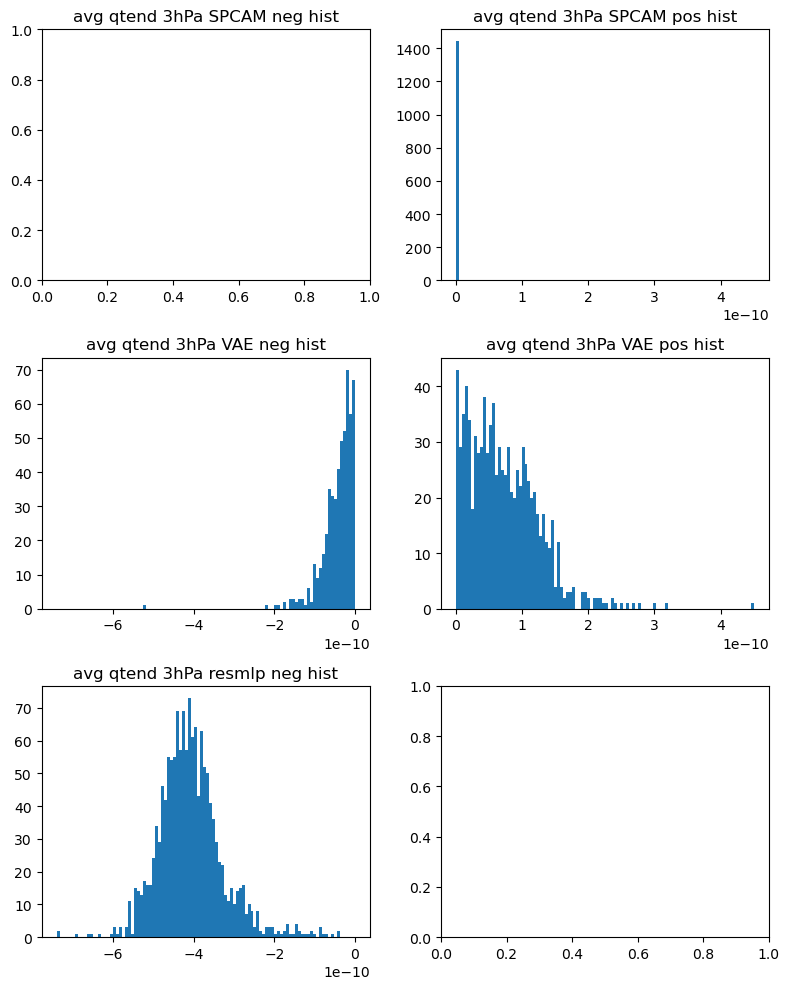

8.989512357526681e-10 -4.595091774757068e-10


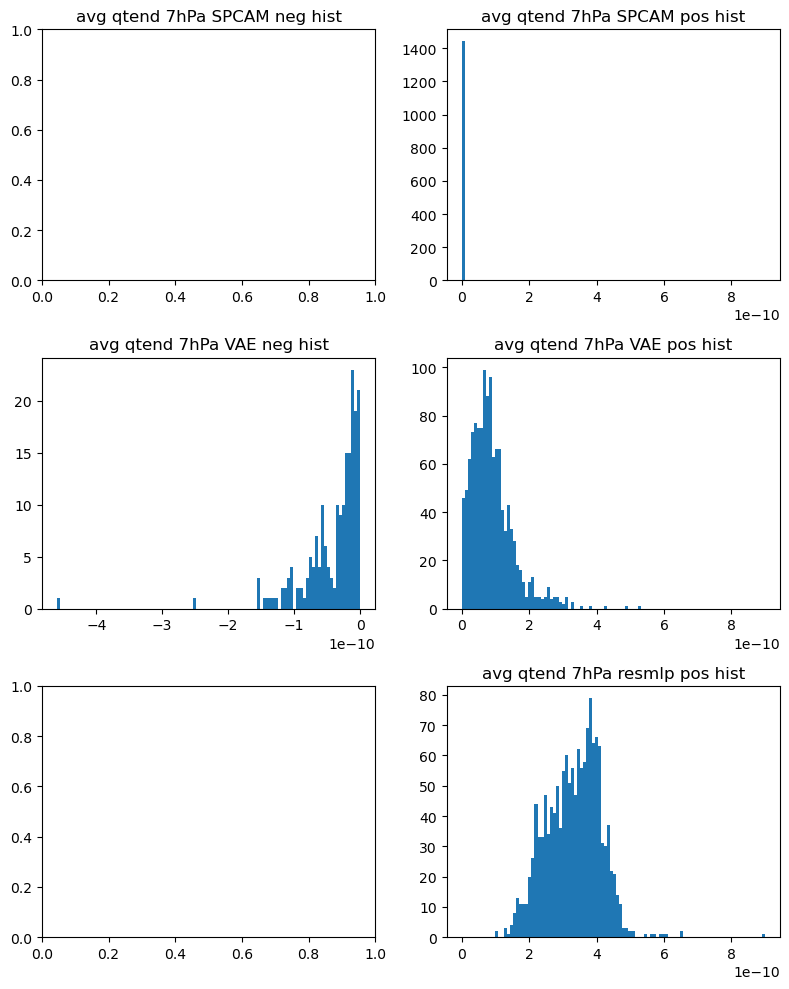

7.490636487518385e-10 -7.856376243808366e-10


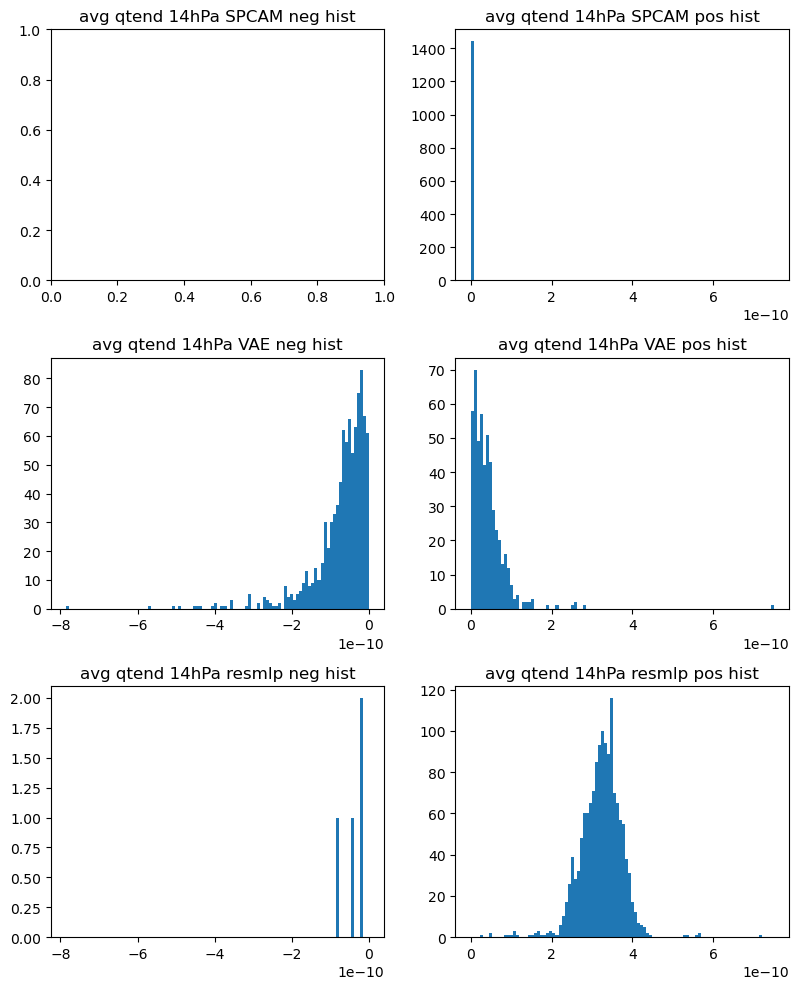

6.036973447947057e-10 -3.8312420148260944e-10


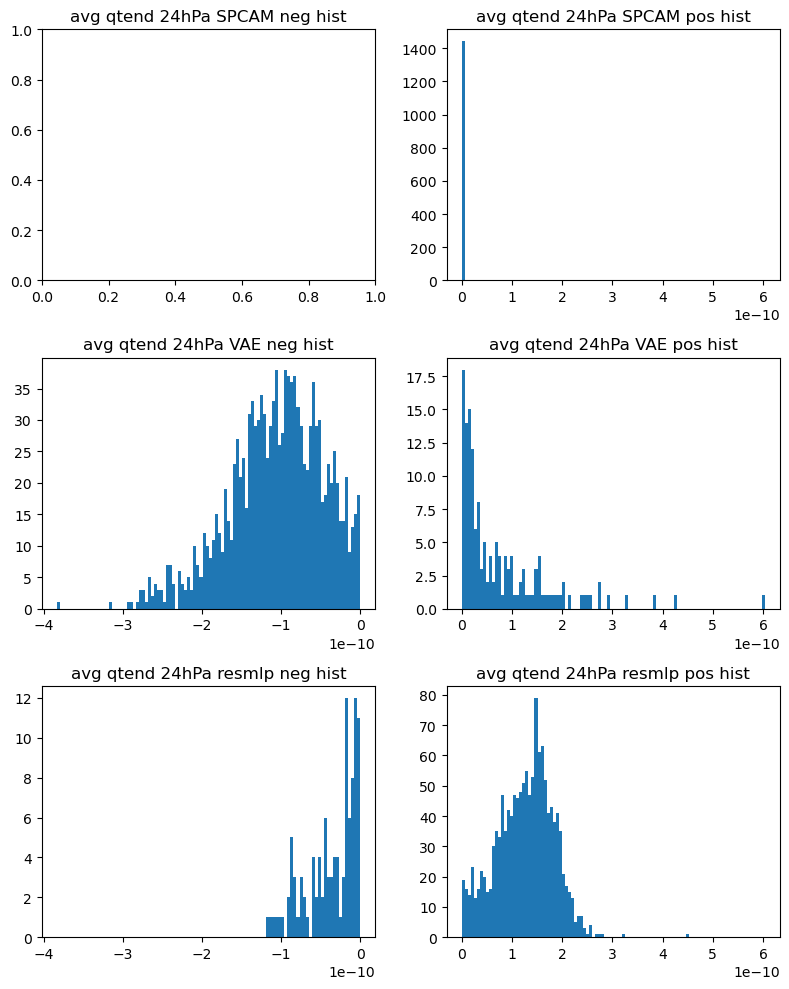

4.827779177229903e-10 -4.769181305127285e-10


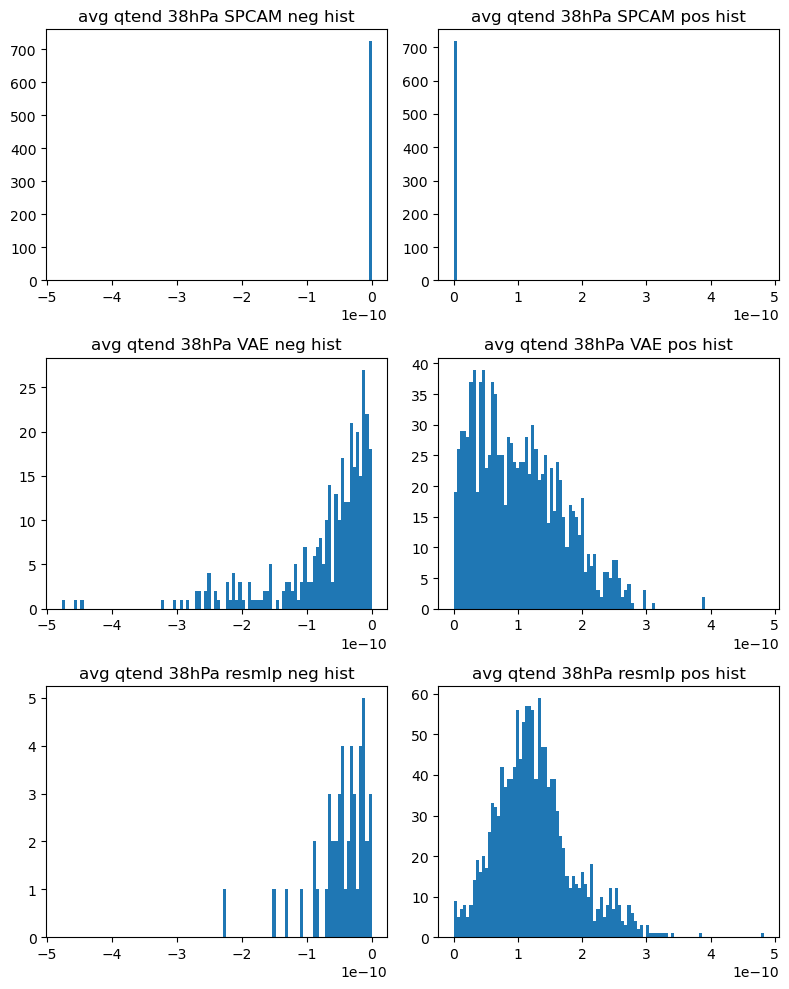

2.2261447138126894e-10 -7.779158194143509e-10


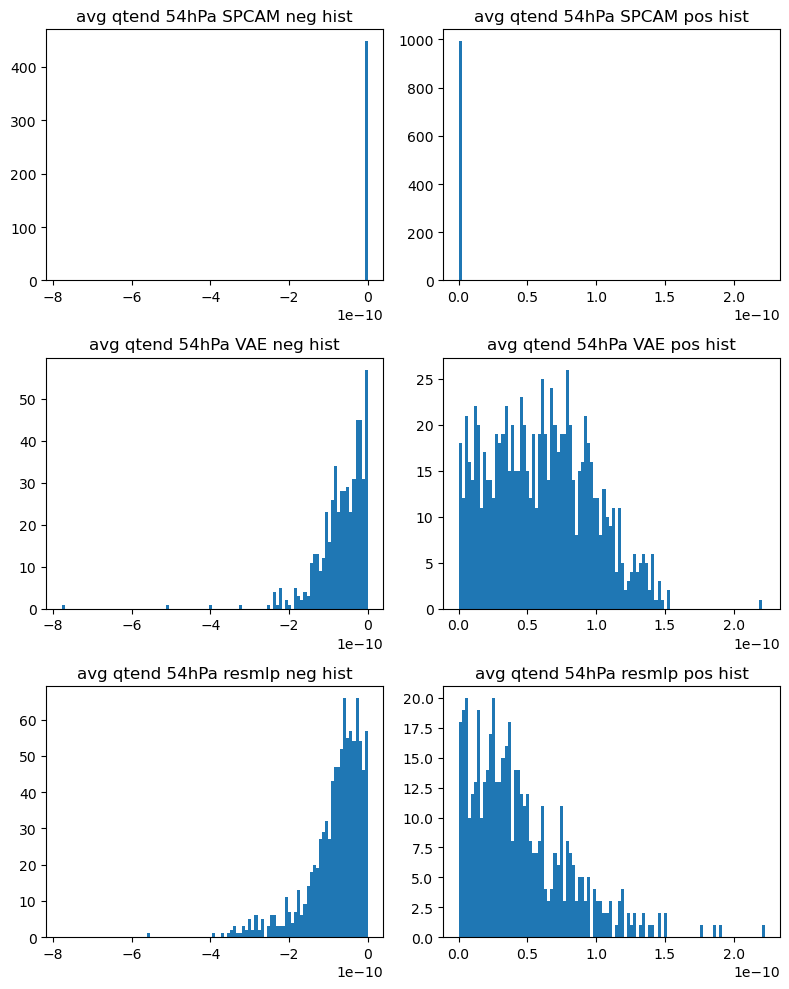

7.578259021112561e-10 -1.639670295583786e-10


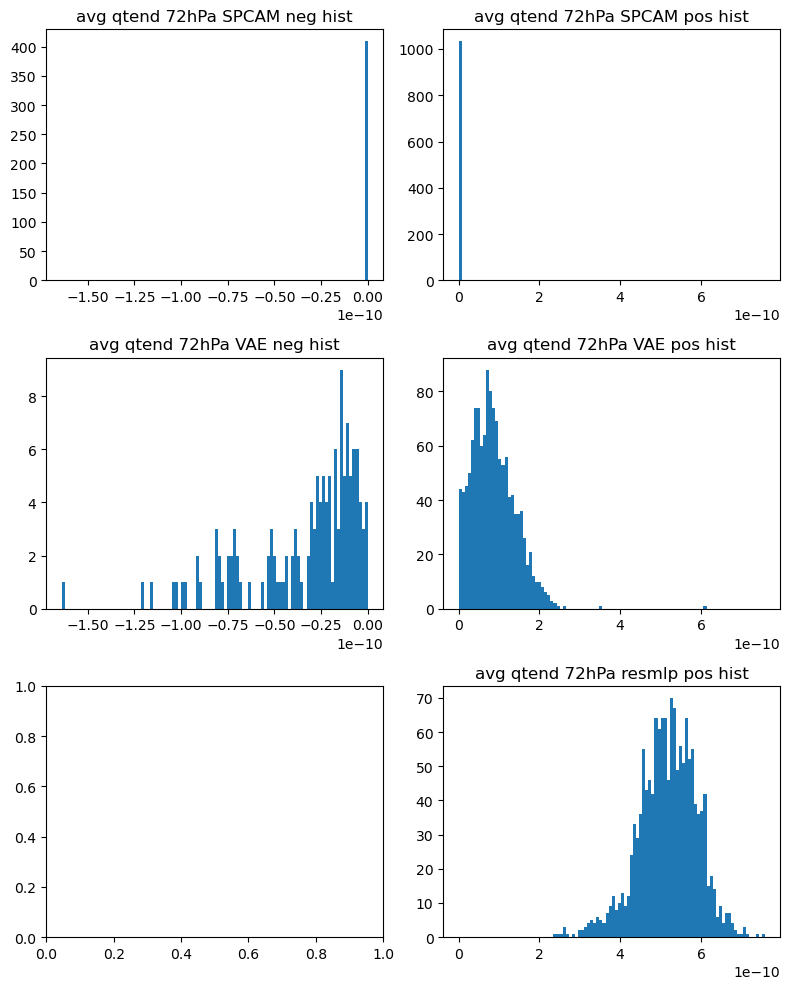

6.831111042150958e-10 -4.389876130073051e-10


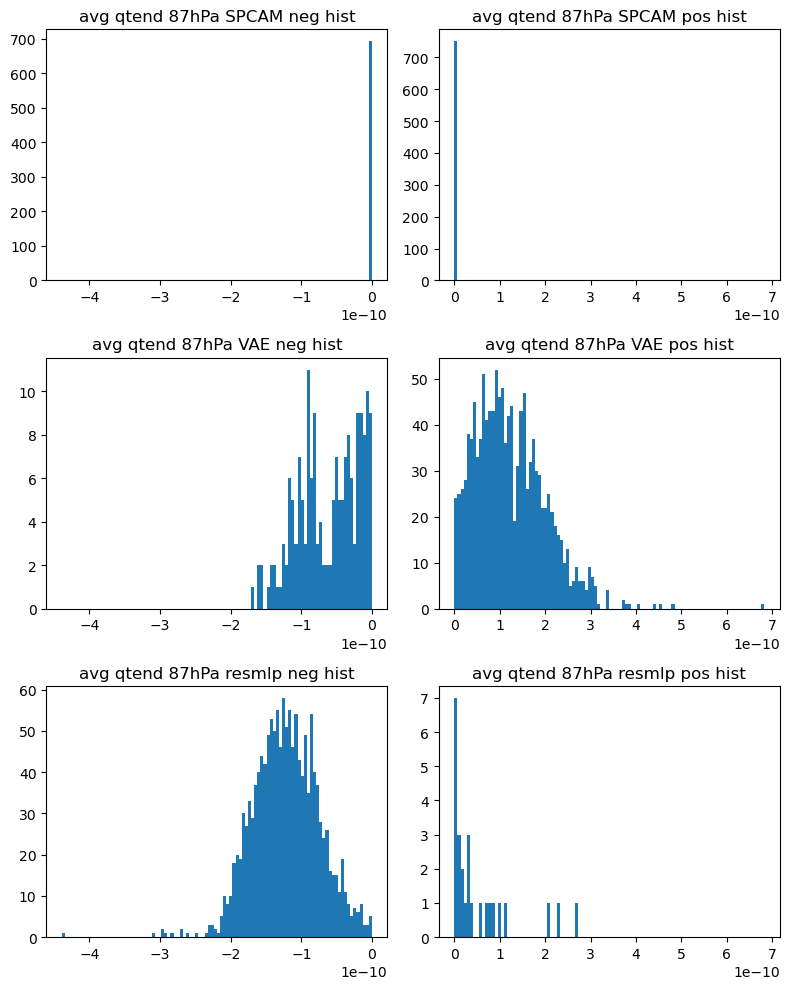

5.102395062816984e-10 -9.84340038143724e-10


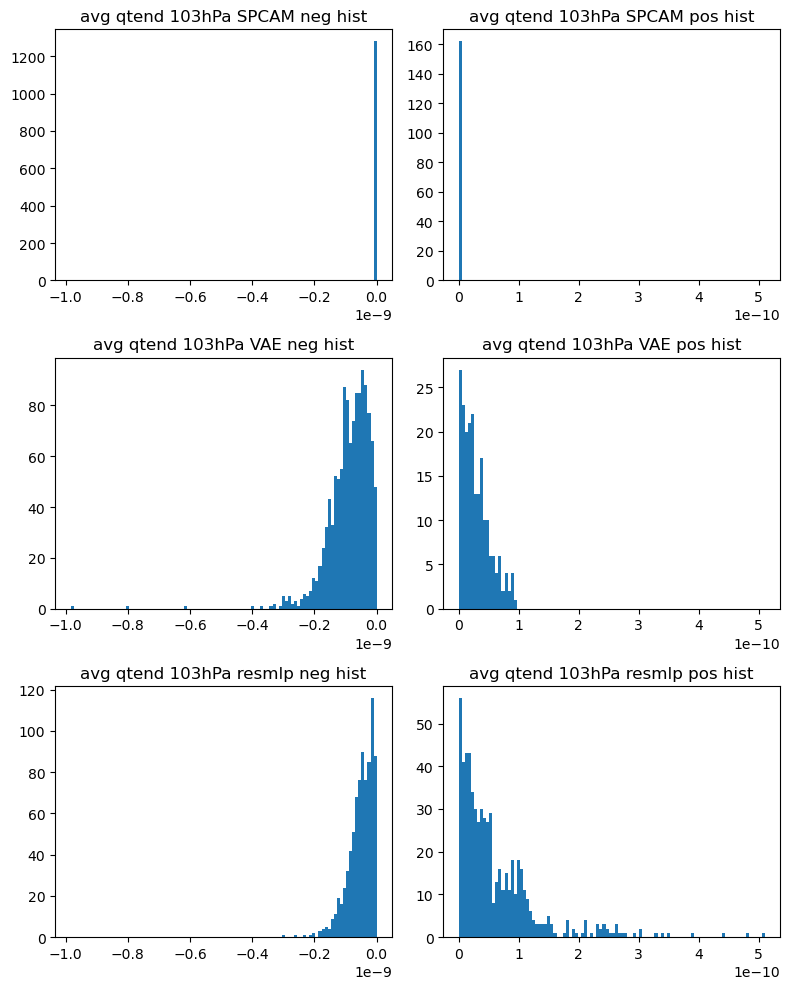

4.284964495138072e-10 -5.310006955195102e-10


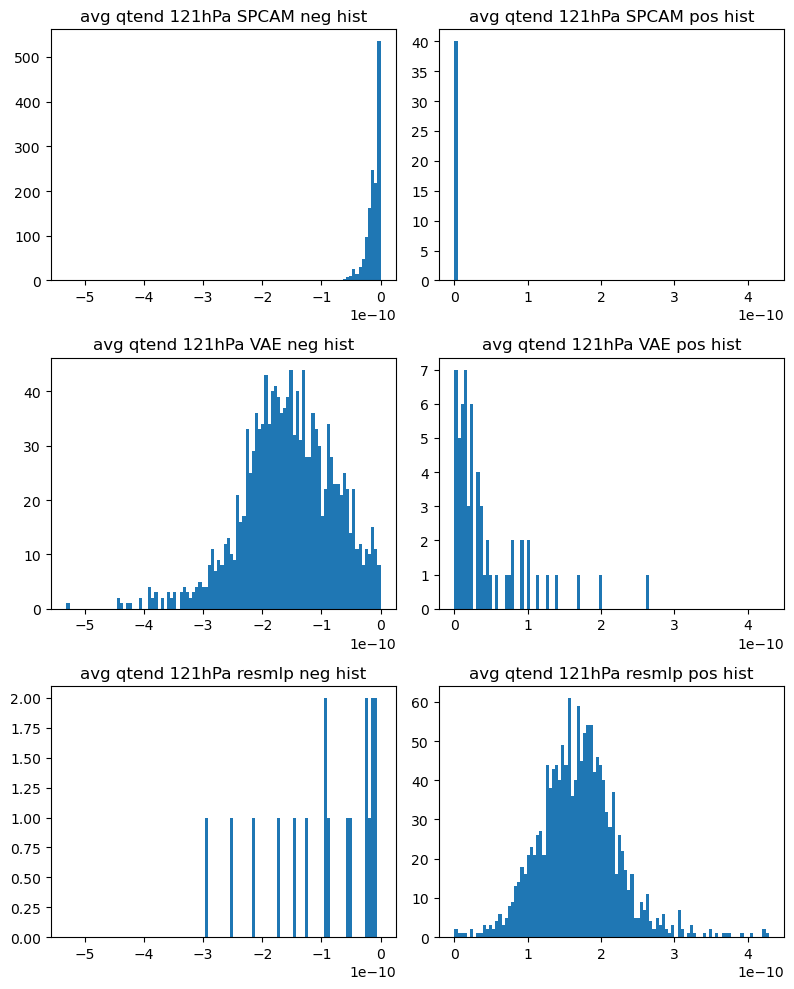

5.070114218152983e-10 -5.804555917034617e-10


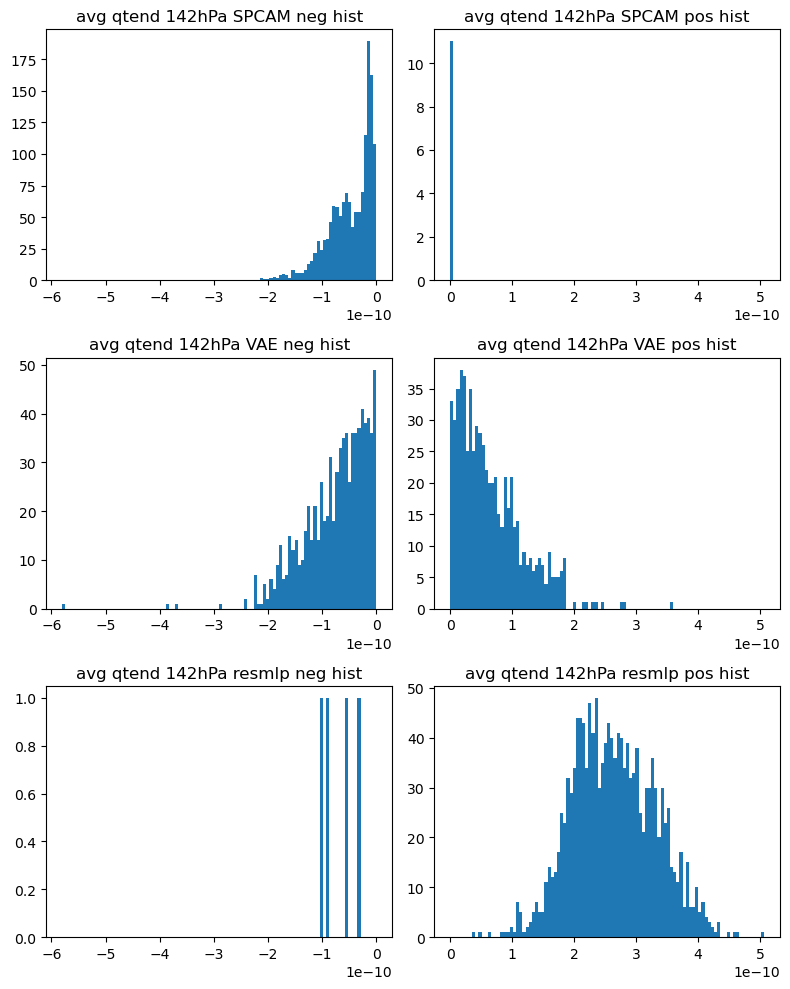

5.399561768512003e-10 -7.310109092163209e-10


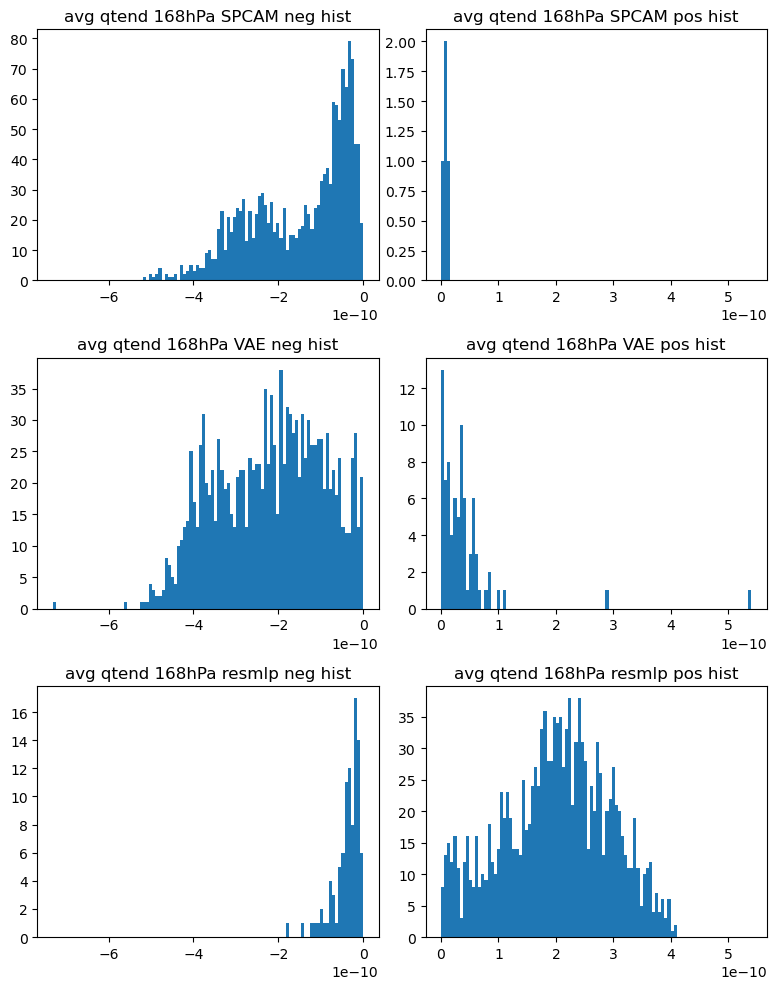

4.089937752572976e-10 -1.3911357511187023e-09


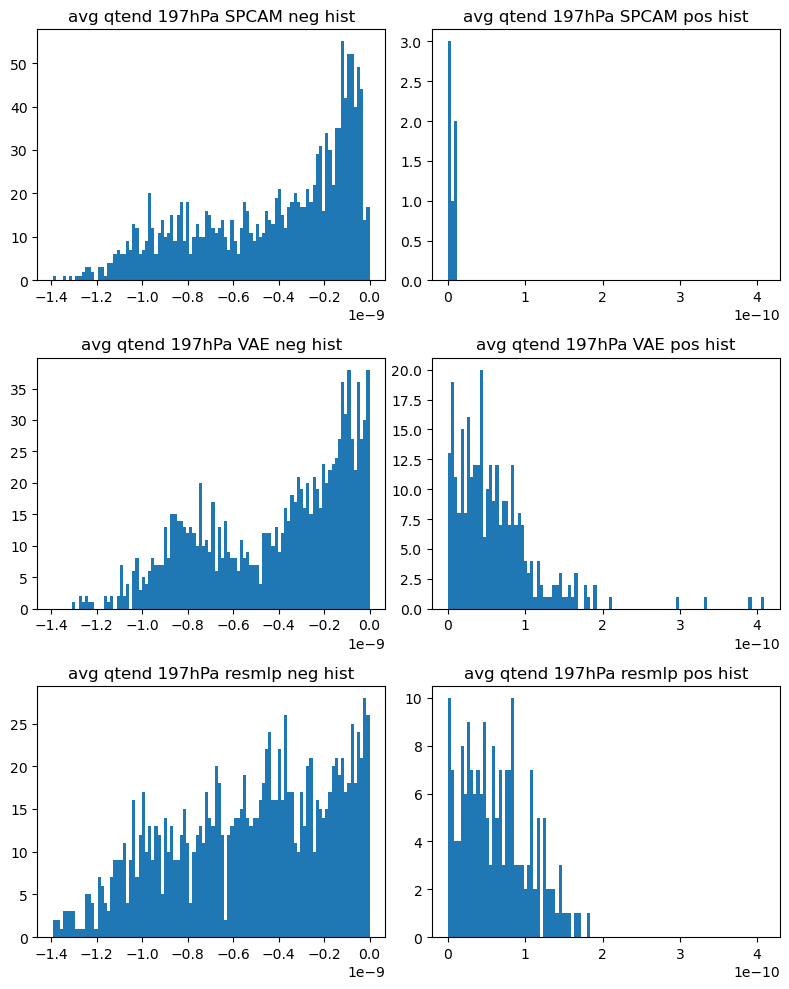

2.045827246420307e-10 -4.176840307037458e-09


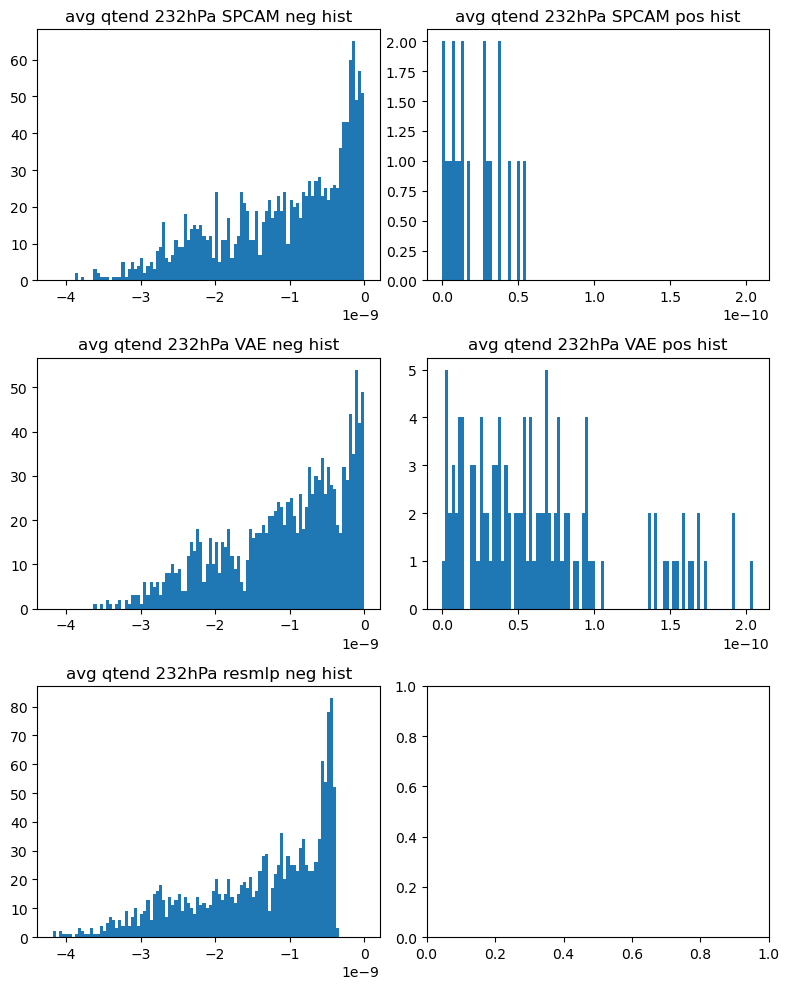

2.34522928121006e-10 -8.878471391495771e-09


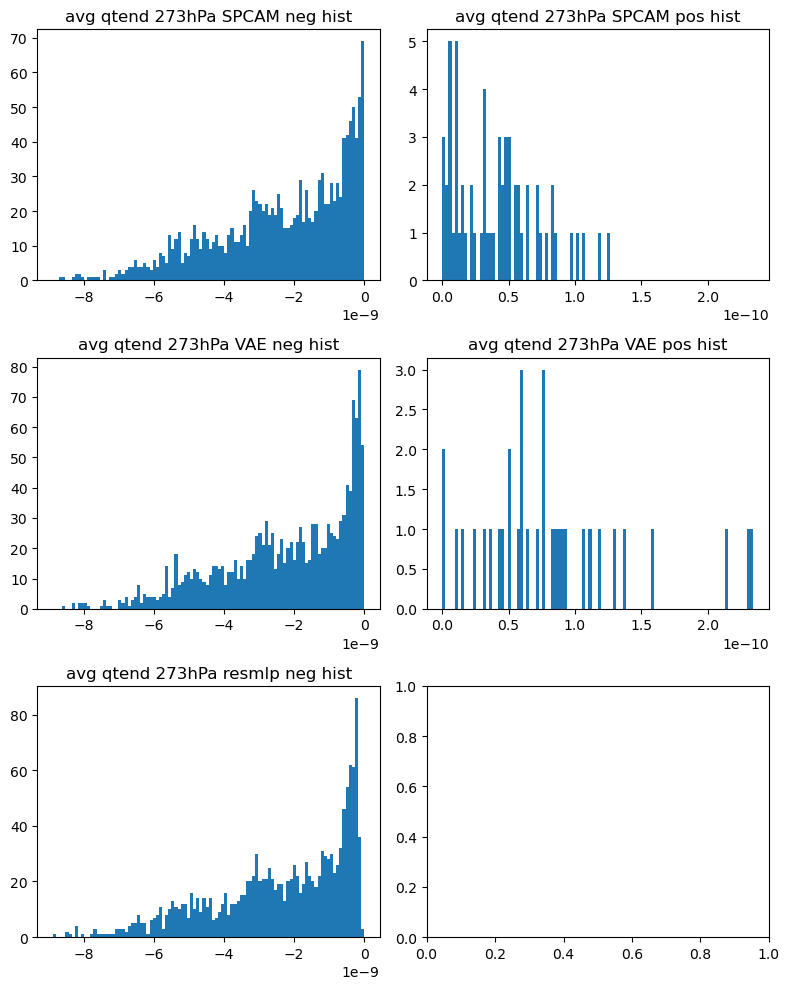

4.0143545692845195e-10 -1.4720637808562097e-08


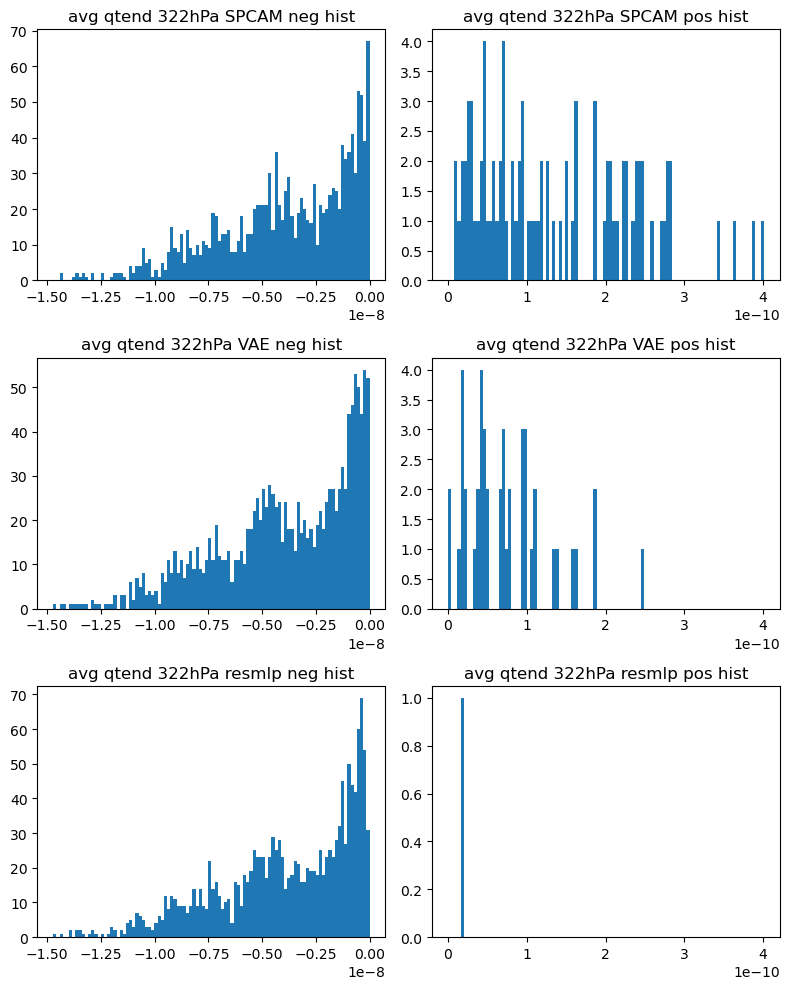

6.465590163207019e-10 -1.7948346908793756e-08


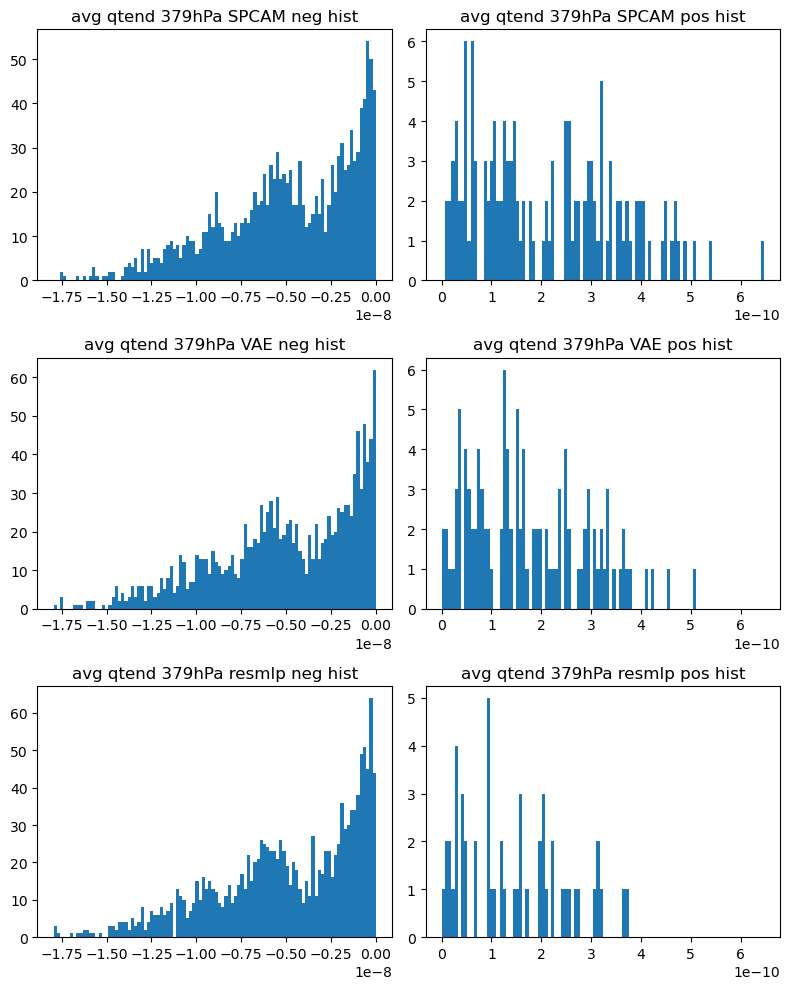

1.5299368106262095e-09 -1.965354822227815e-08


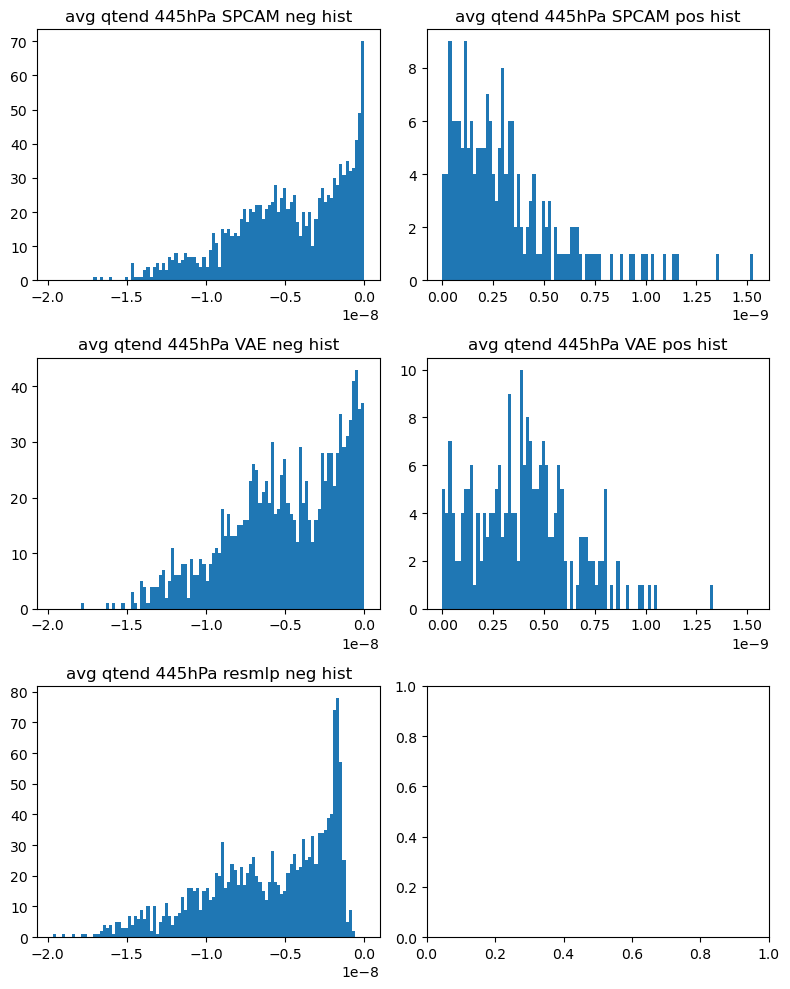

4.4390920131605e-09 -1.607378951059778e-08


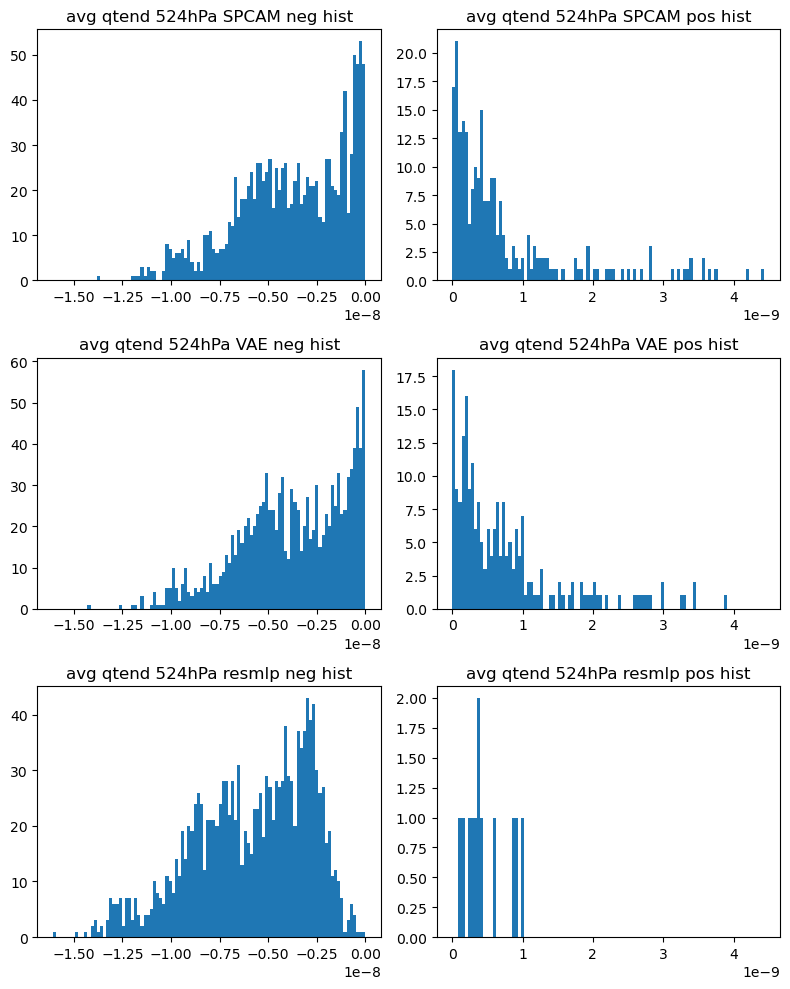

8.318813344083366e-09 -2.2783961484220673e-08


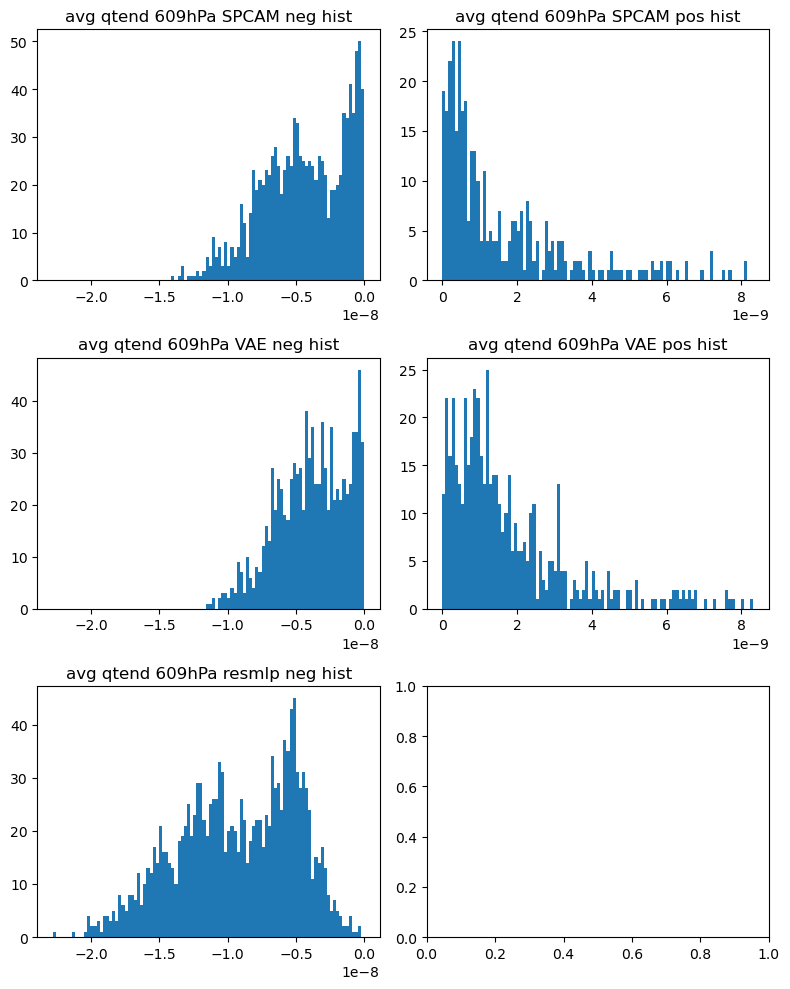

1.5915310081191777e-08 -2.5583943952325318e-08


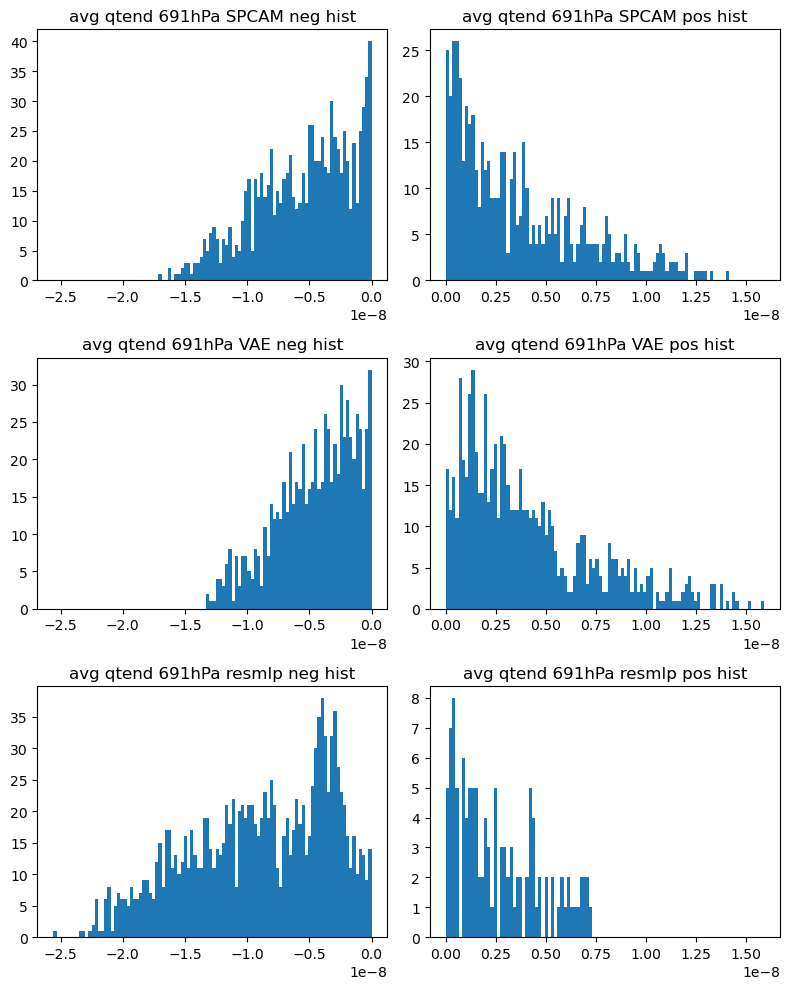

2.6745915111213903e-08 -2.0065993982132903e-08


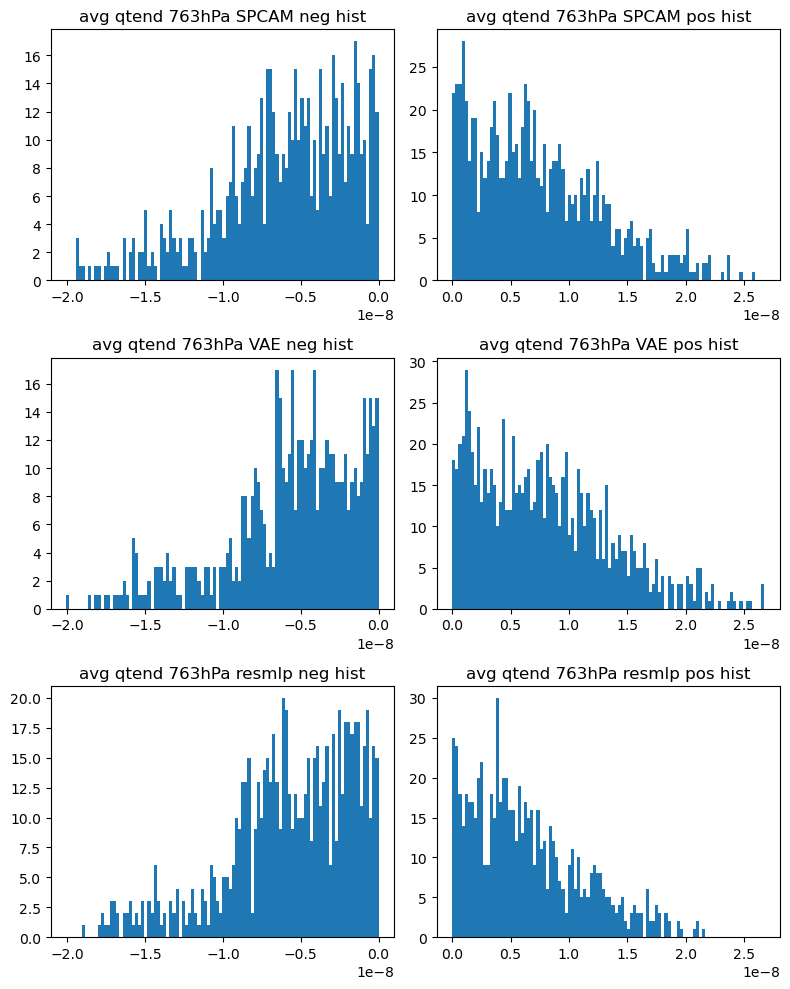

3.2386143862825856e-08 -2.423164287169072e-08


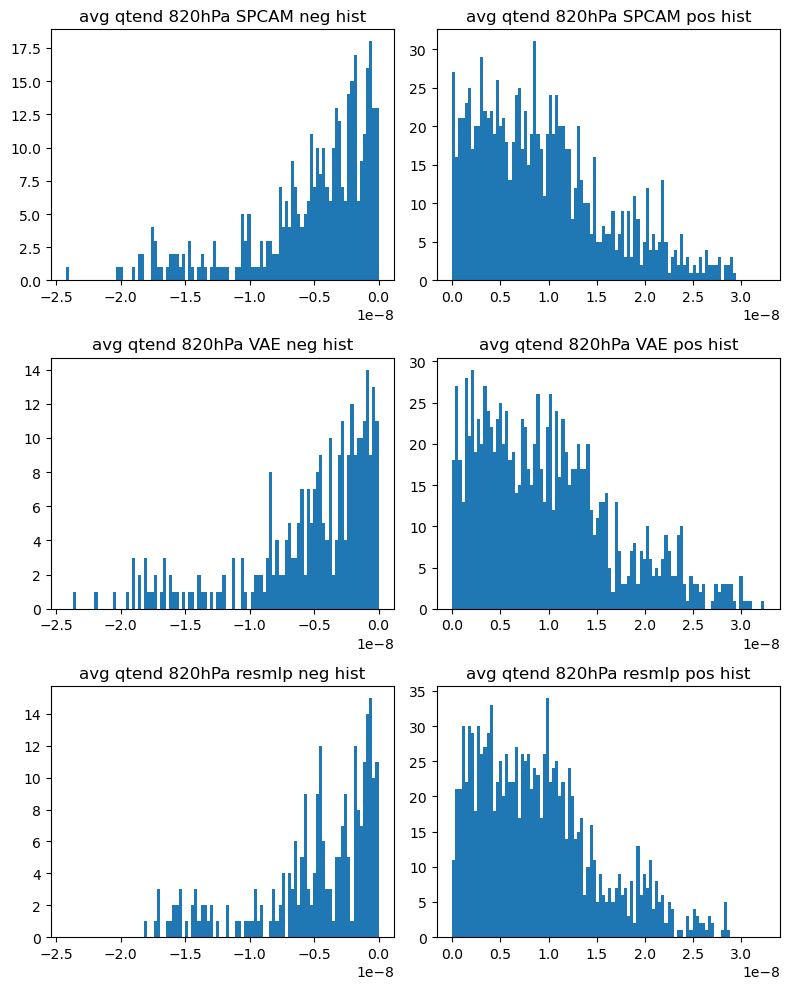

3.481686771119818e-08 -3.461111347081347e-08


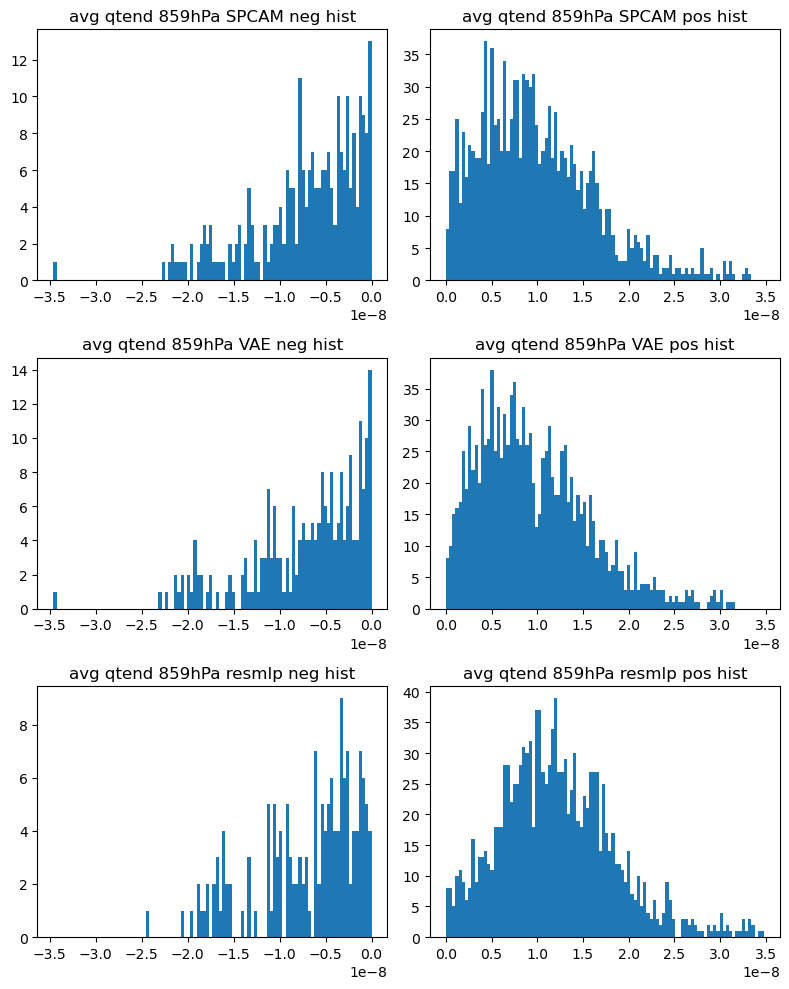

3.9904357251954175e-08 -4.161651218446134e-08


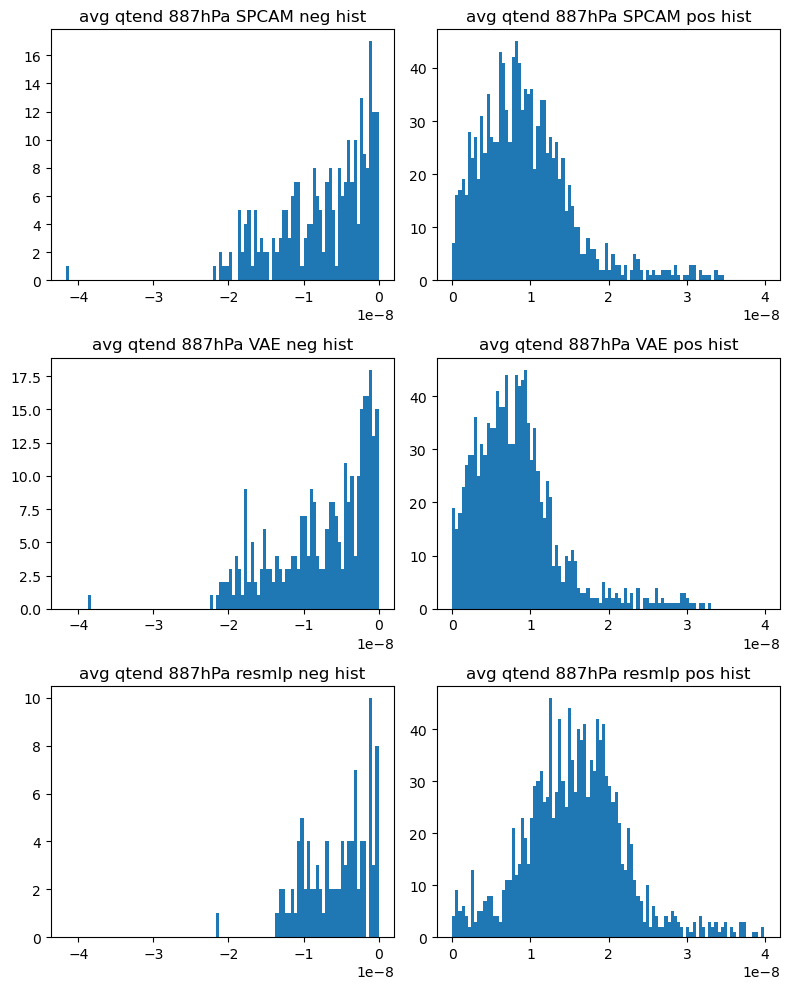

4.250022921378437e-08 -3.822563707036079e-08


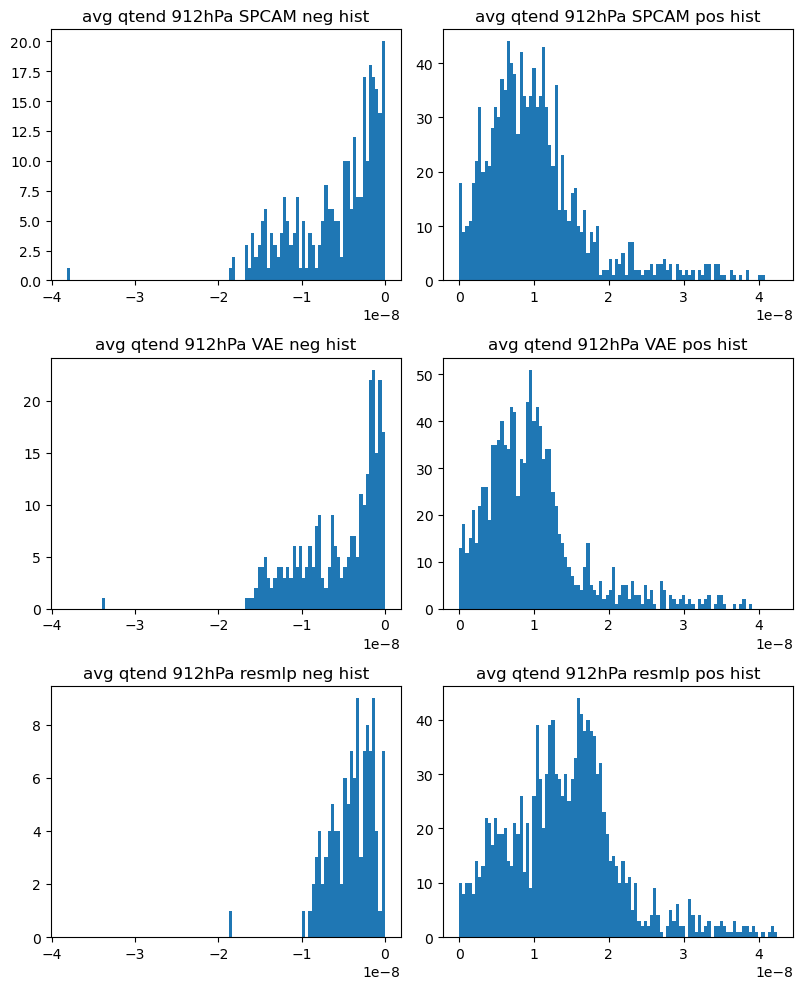

4.8935867014234795e-08 -2.4810018826614395e-08


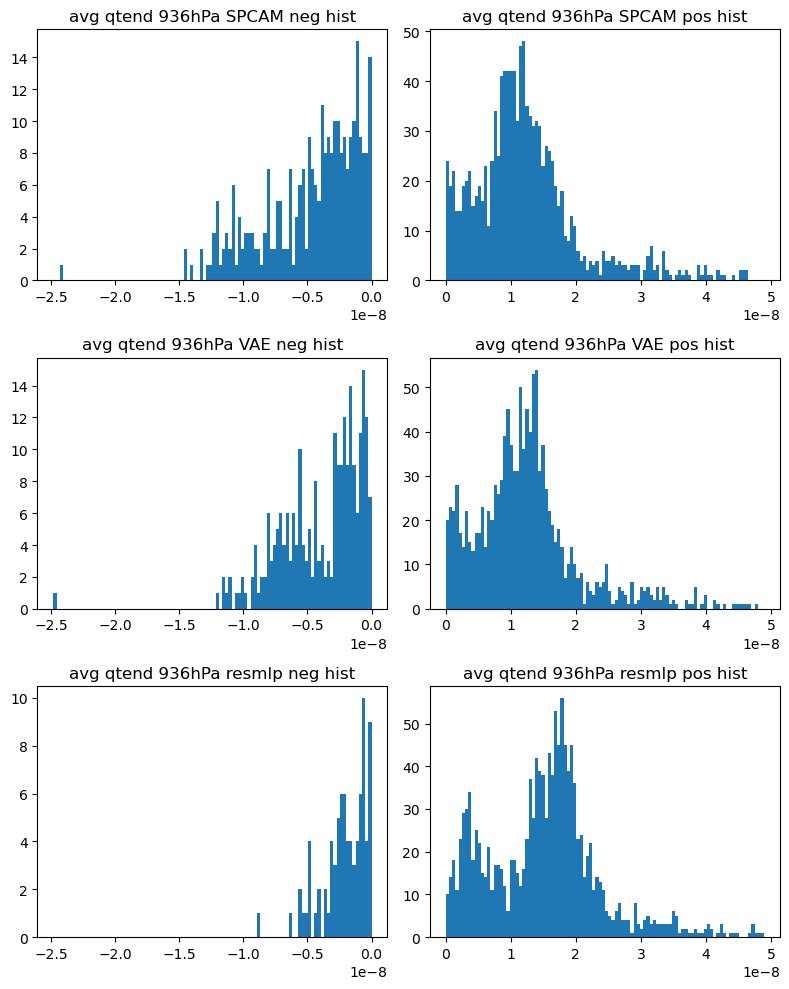

5.97961645643874e-08 -1.3770361408325783e-08


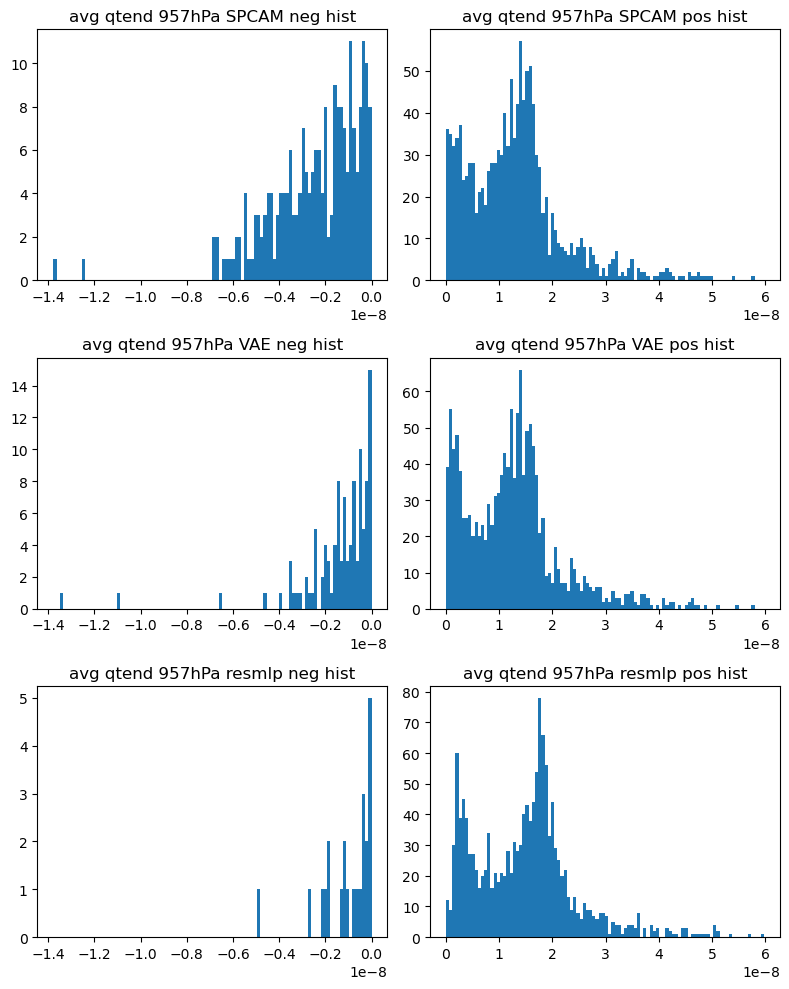

5.996905382285255e-08 -2.731043934172993e-08


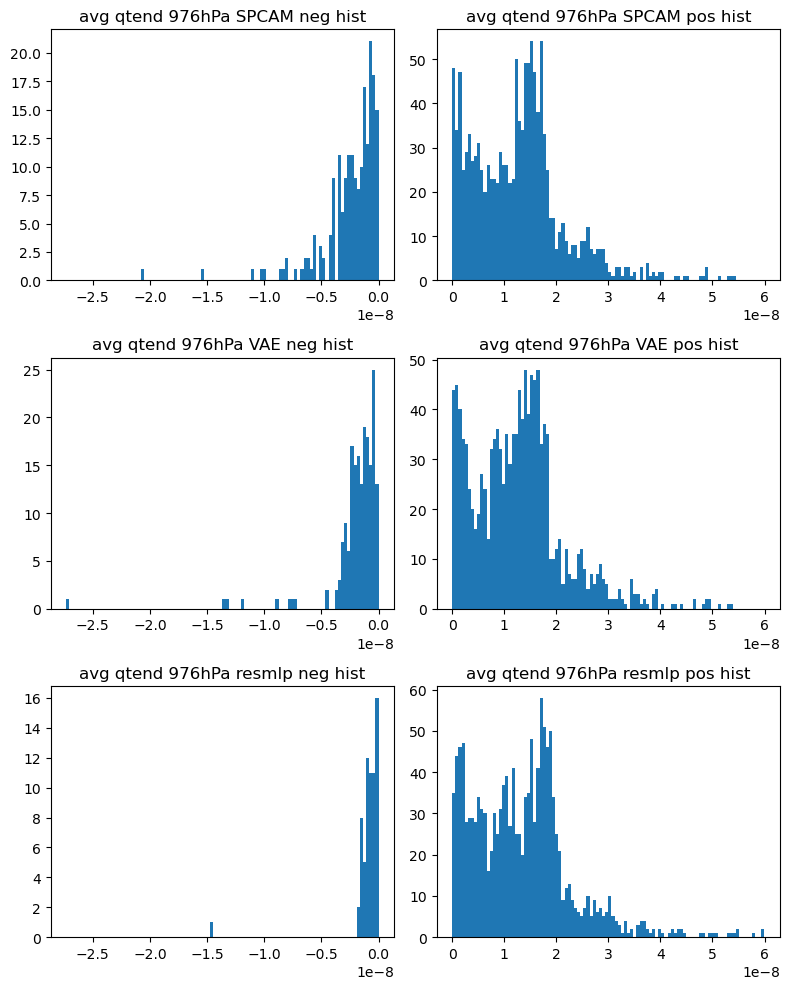

-1.1993813926135588e-07 -5.315964558148032e-07


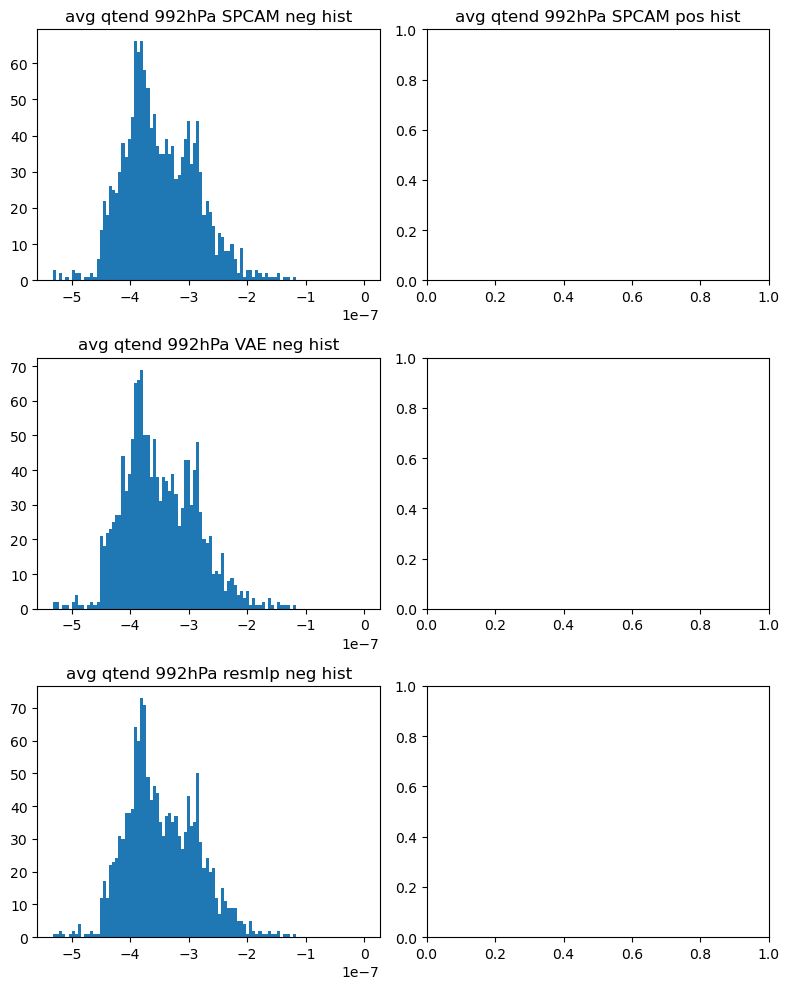

In [133]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from matplotlib.ticker import FuncFormatter
one_decimal_formatter = FuncFormatter(lambda x, _: f'{x:.1e}')
for i in range(0,30):
    pred = np.zeros((mask.shape))
    pred[mask.astype(bool)] = avg_pred[:,i]
    gt = np.zeros((mask.shape))
    gt[mask.astype(bool)] = avg_gt[:,i]
    pred_resmlp = np.zeros((mask.shape))
    pred_resmlp[mask.astype(bool)] = avg_pred_resmlp[:,i]
    fig, ax = plt.subplots(3,2, figsize=(8,10))
    cbar_label = "kg/kg/s"
    # ax[0].set_title(f"avg qtend {levs[i]}hPa SPCAM")
    vmax = max(avg_gt[:,i].max(), avg_pred[:,i].max(), avg_pred_resmlp[:,i].max())+1e-16
    vmin = min(avg_gt[:,i].min(), avg_pred[:,i].min(), avg_pred_resmlp[:,i].min())-1e-16
    print(vmax, vmin)
    gt_pos = gt.copy()
    gt_pos = gt_pos[gt_pos>0]
    gt_neg = gt.copy()
    gt_neg = gt_neg[gt_neg<0]
    # print(gt_neg)
    ax[0,1].set_title(f"avg qtend {levs[i]}hPa SPCAM pos hist")
    ax[0,0].set_title(f"avg qtend {levs[i]}hPa SPCAM neg hist")
    if vmax > 0 and  np.any(gt>0):
        ax[0,1].hist(gt_pos.flatten(), bins=100, range=(0, vmax))
    #     # plot_spatial(lon[min_y:max_y], lat[min_x:max_x], gt_pos[min_x:max_x,min_y:max_y],ax=ax[0], cbar_label=cbar_label, vmin=0, vmax=vmax, cmap="Reds", cbar_formatter=one_decimal_formatter)
    if vmin < 0 and np.any(gt<0):
        ax[0,0].hist(gt_neg.flatten(), bins=100, range=(vmin,0))
    #     #plot_spatial(lon[min_y:max_y], lat[min_x:max_x], gt_neg[min_x:max_x,min_y:max_y],ax=ax[0], cbar_label=cbar_label, vmin=vmin, vmax=0, cmap="Blues_r", cbar_formatter=one_decimal_formatter)
    # # ax[1].set_title(f"avg qtend {levs[i]}hPa VAE_loc_code R2: {r2_score(gt[mask.astype(bool)], pred[mask.astype(bool)]):.2f}")
    pred_pos = pred.copy()
    pred_pos = pred_pos[pred_pos>0]
    pred_neg = pred.copy()
    pred_neg = pred_neg[pred_neg<0]
    if np.any(vmax > 0 and pred>0):
        ax[1,1].set_title(f"avg qtend {levs[i]}hPa VAE pos hist")
        ax[1,1].hist(pred_pos.flatten(), bins=100, range=(0, vmax))
    #     # plot_spatial(lon[min_y:max_y], lat[min_x:max_x], pred_pos[min_x:max_x,min_y:max_y],ax=ax[1], cbar_label=cbar_label, vmin=0, vmax=vmax, cmap="Reds", cbar_formatter=one_decimal_formatter)
    if np.any(vmin < 0 and pred<0):
        ax[1,0].set_title(f"avg qtend {levs[i]}hPa VAE neg hist")
        ax[1,0].hist(pred_neg.flatten(), bins=100, range=(vmin,0))
    #     # plot_spatial(lon[min_y:max_y], lat[min_x:max_x], pred_neg[min_x:max_x,min_y:max_y],ax=ax[1], cbar_label=cbar_label, vmin=vmin, vmax=0, cmap="Blues_r", cbar_formatter=one_decimal_formatter)
    # # ax[2].set_title(f"avg qtend {levs[i]}hPa resmlp R2: {r2_score(gt[mask.astype(bool)], pred_resmlp[mask.astype(bool)]):.2f}")
    pred_resmlp_pos = pred_resmlp.copy()
    pred_resmlp_pos = pred_resmlp_pos[pred_resmlp_pos>0]
    pred_resmlp_neg = pred_resmlp.copy()
    pred_resmlp_neg = pred_resmlp_neg[pred_resmlp_neg<0]
    if vmax > 0 and np.any(pred_resmlp>0):
    # if np.any(vmax > 0):
        ax[2,1].set_title(f"avg qtend {levs[i]}hPa resmlp pos hist")
        ax[2,1].hist(pred_resmlp_pos.flatten(), bins=100, range=(0, vmax))
    if vmin < 0 and np.any(pred_resmlp<0):
    # if np.any(vmin < 0):
        ax[2,0].set_title(f"avg qtend {levs[i]}hPa resmlp neg hist")
        ax[2,0].hist(pred_resmlp_neg.flatten(), bins=100, range=(vmin,0))
    plt.tight_layout()
    plt.show()

In [169]:
spatial_vae_metrics = np.load("vae_analysis_ckpts/comb_vae_twp/offline_test_ae_spatial.npz", allow_pickle=True)
spatial_resmlp_metrics = np.load("resmlp_analysis_ckpts/ex_qtend_twp_rect_spatial.npz", allow_pickle=True)
spatial_resmlp2_metrics = np.load("resmlp_analysis_ckpts/ex_qtend_twp_rect_all_spatial.npz", allow_pickle=True)
time_vae_metrics = np.load("vae_analysis_ckpts/comb_vae_twp/offline_test_ae_time.npz", allow_pickle=True)
time_resmlp_metrics = np.load("resmlp_analysis_ckpts/ex_qtend_twp_rect_time.npz", allow_pickle=True)
time_resmlp2_metrics = np.load("resmlp_analysis_ckpts/ex_qtend_twp_rect_all_time.npz", allow_pickle=True)

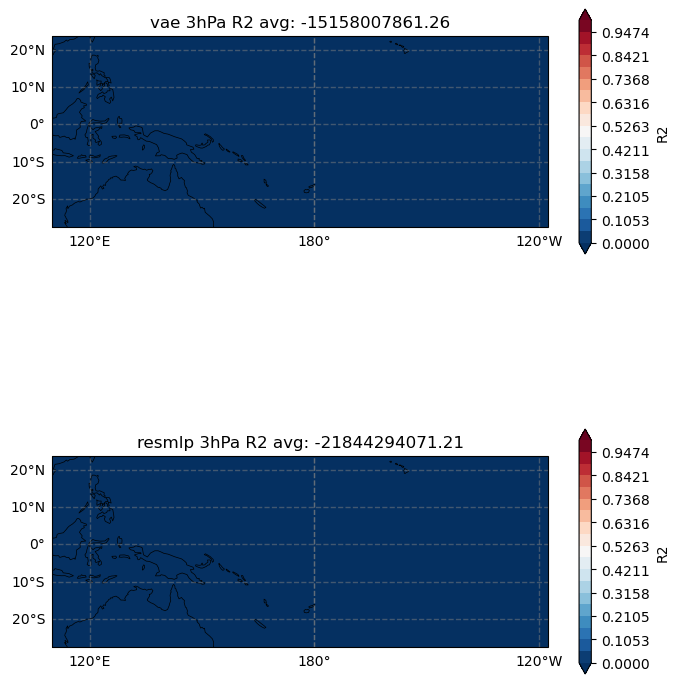

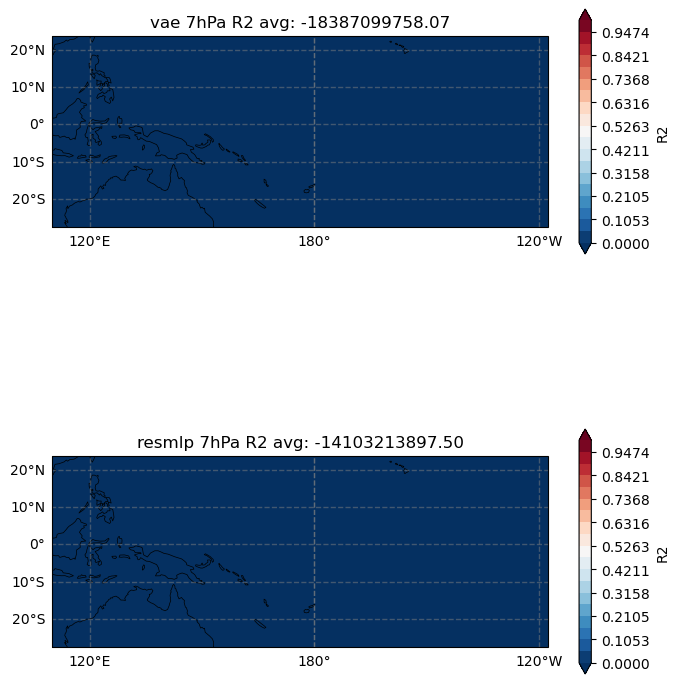

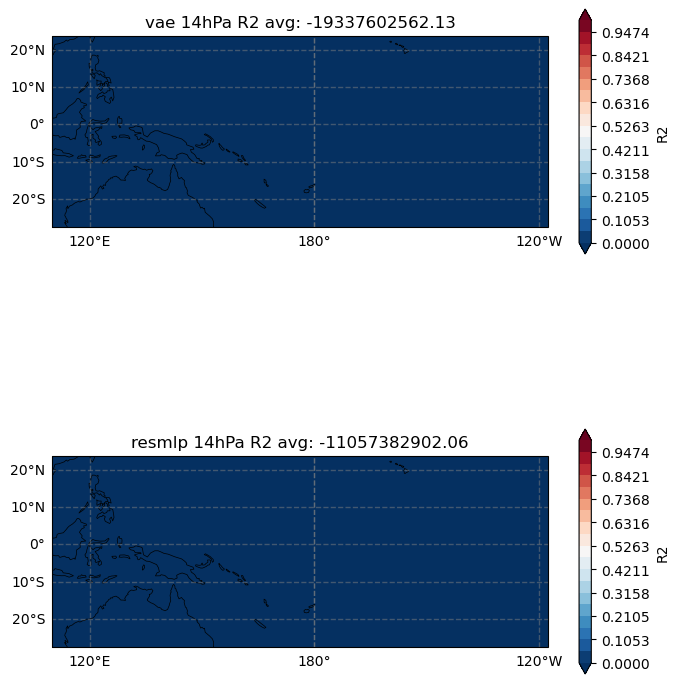

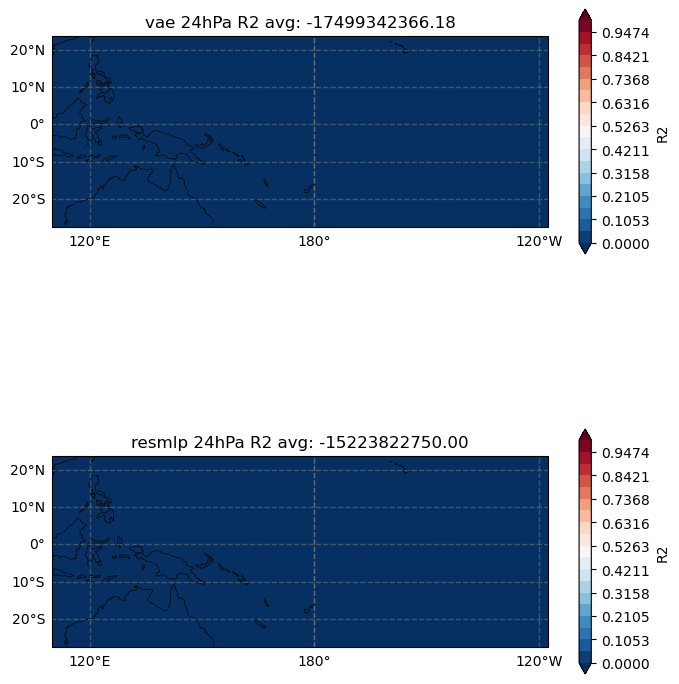

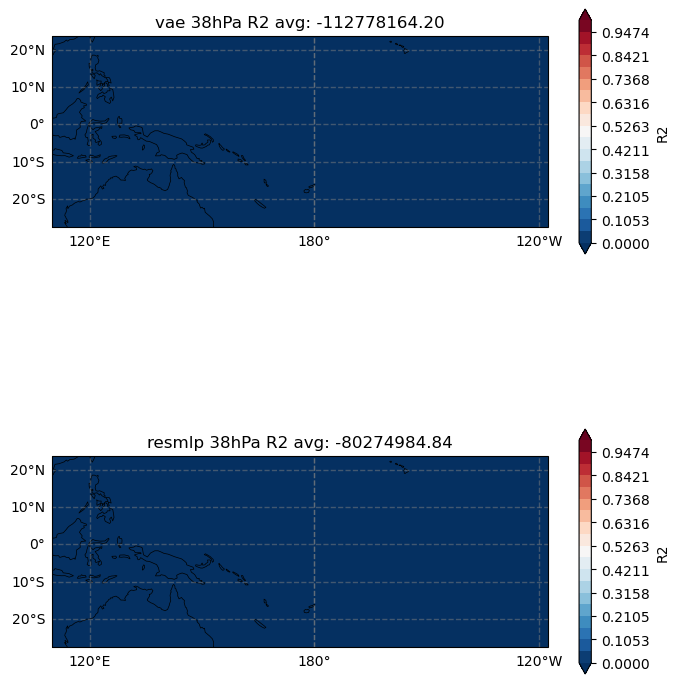

...

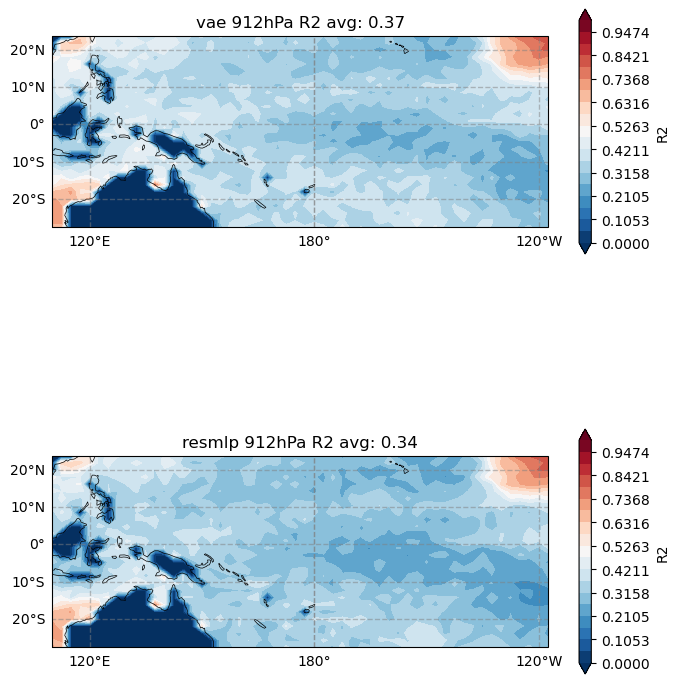

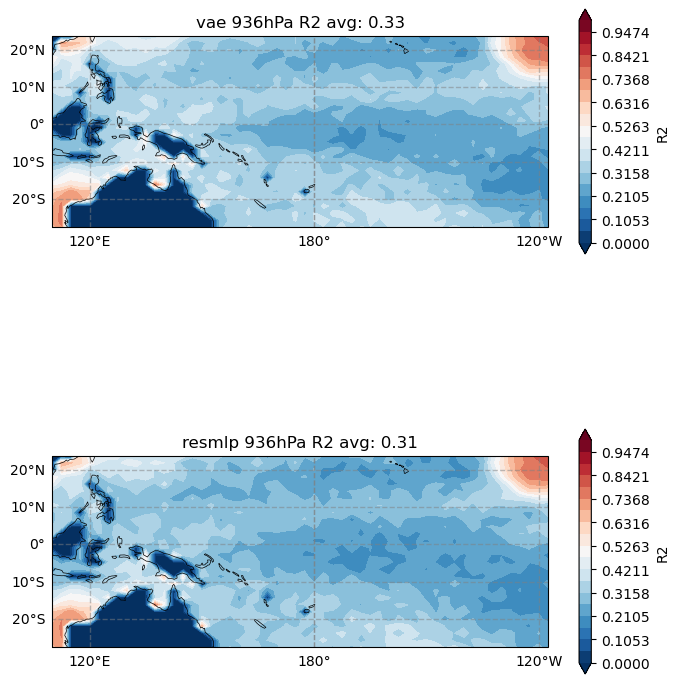

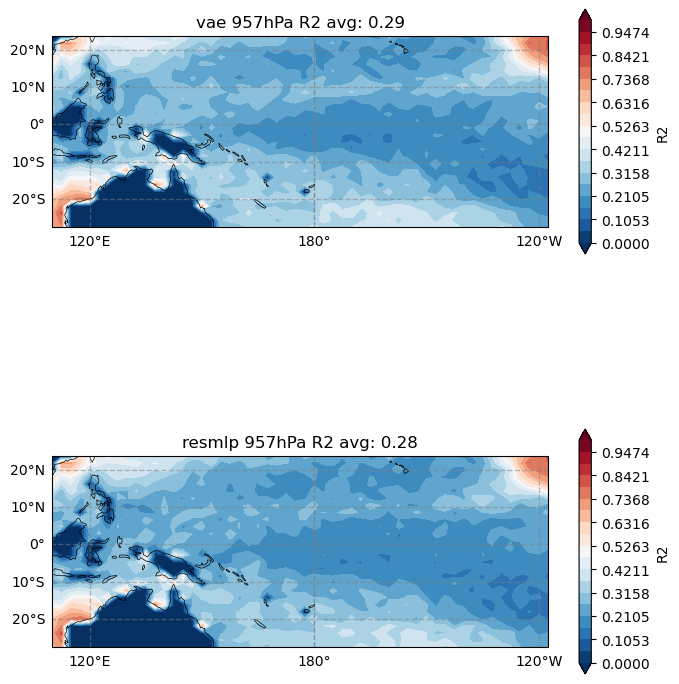

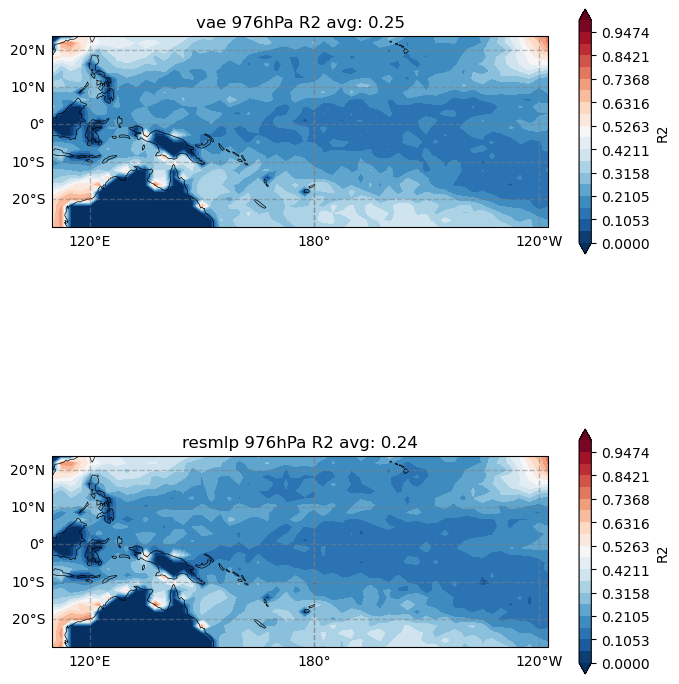

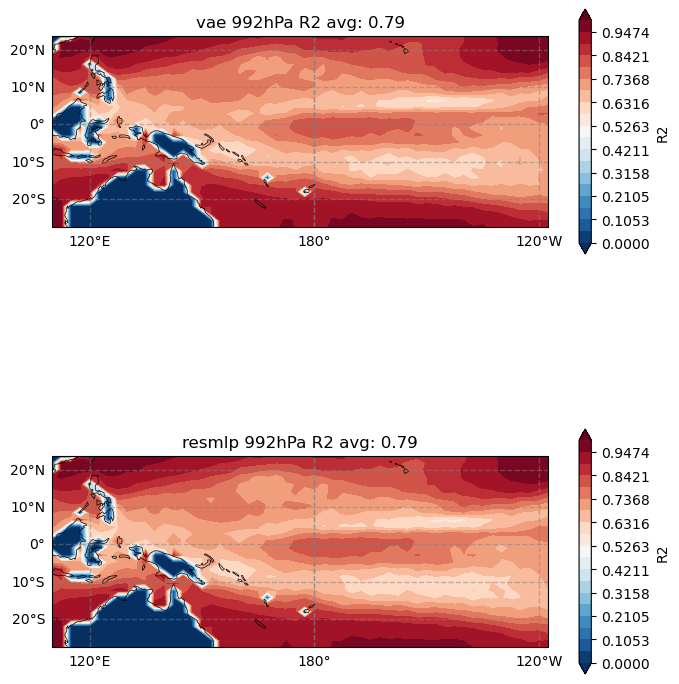

In [83]:
for i in range(30):
    fig, axes = plt.subplots(2,1, figsize=(8,10), subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)})
    r2_vae = np.zeros((mask.shape))
    r2_vae[mask.astype(bool)] = spatial_vae_metrics["r2"][:,i]
    axes[0].set_title(f"vae {levs[i]}hPa R2 avg: {np.mean(r2_vae[mask.astype(bool)]):.2f}")
    plot_spatial(lon[min_y:max_y], lat[min_x:max_x], r2_vae[min_x:max_x, min_y:max_y], ax=axes[0], cbar_label="R2", vmin=0, vmax=1, cmap="RdBu_r")
    r2_resmlp = np.zeros((mask.shape))
    r2_resmlp[mask.astype(bool)] = spatial_resmlp_metrics["r2"][:,i]
    axes[1].set_title(f"resmlp {levs[i]}hPa R2 avg: {np.mean(r2_resmlp[mask.astype(bool)]):.2f}")
    plot_spatial(lon[min_y:max_y], lat[min_x:max_x], r2_resmlp[min_x:max_x,min_y:max_y], ax=axes[1], cbar_label="R2", vmin=0, vmax=1, cmap="RdBu_r")
    plt.show()

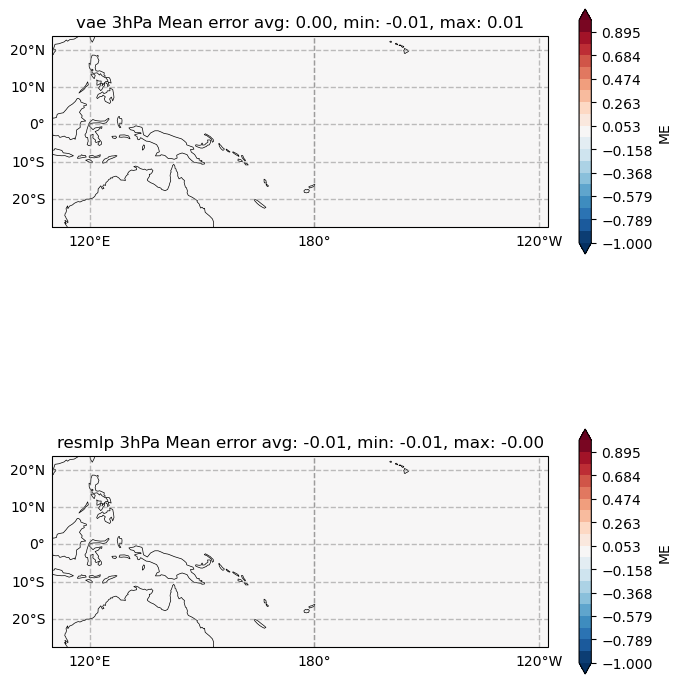

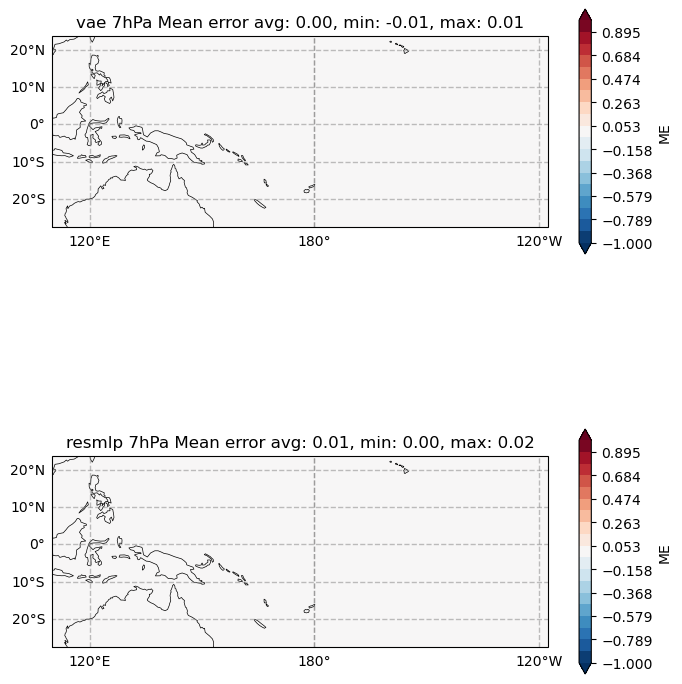

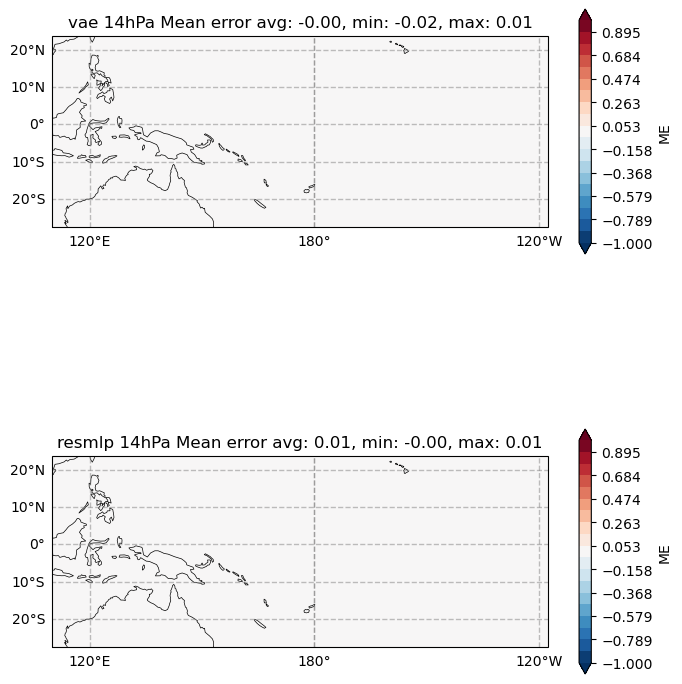

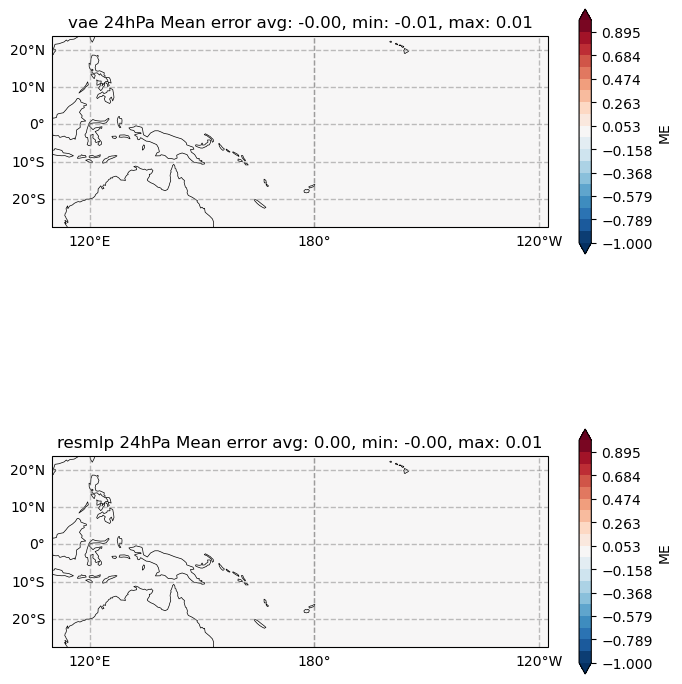

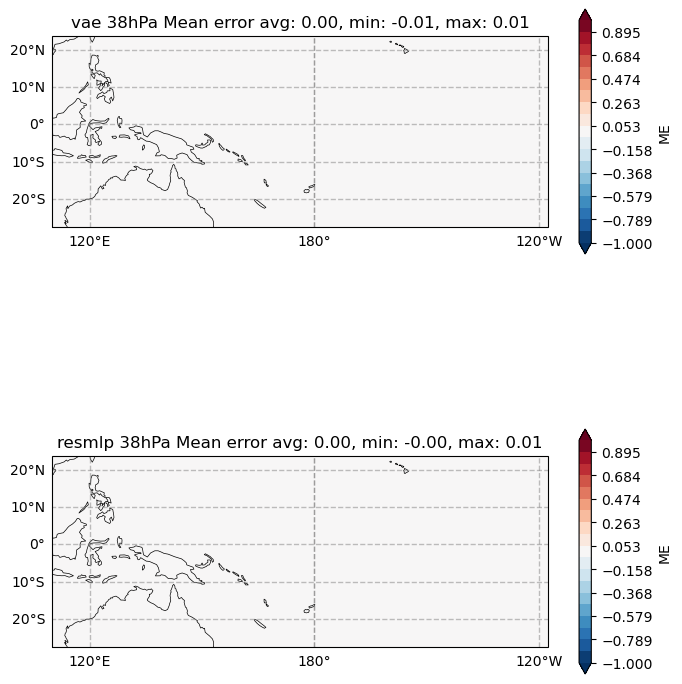

...

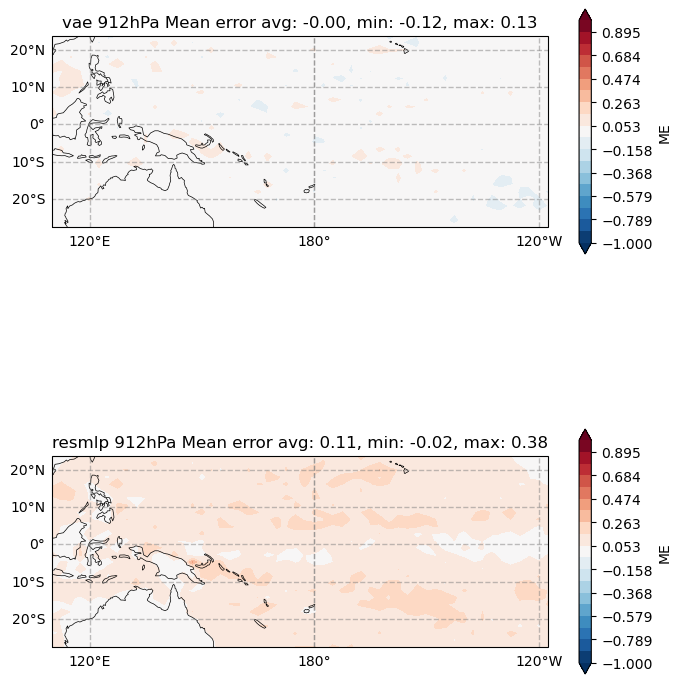

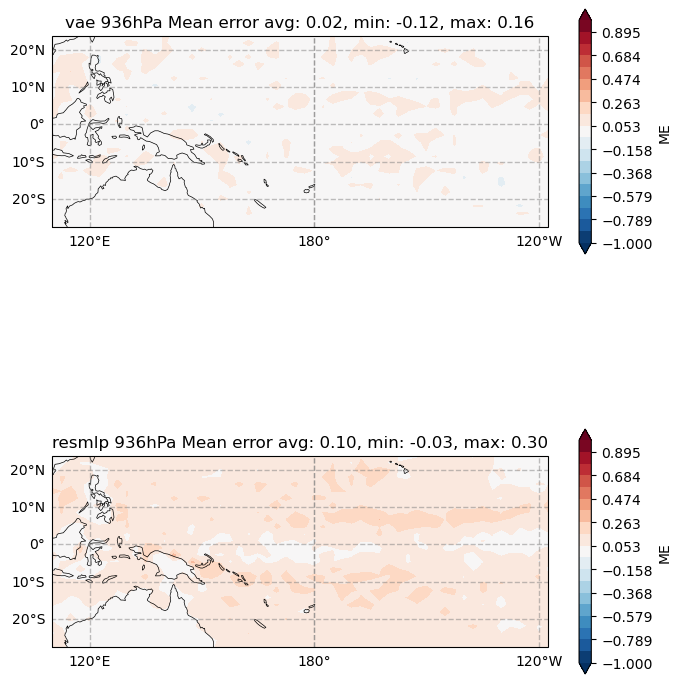

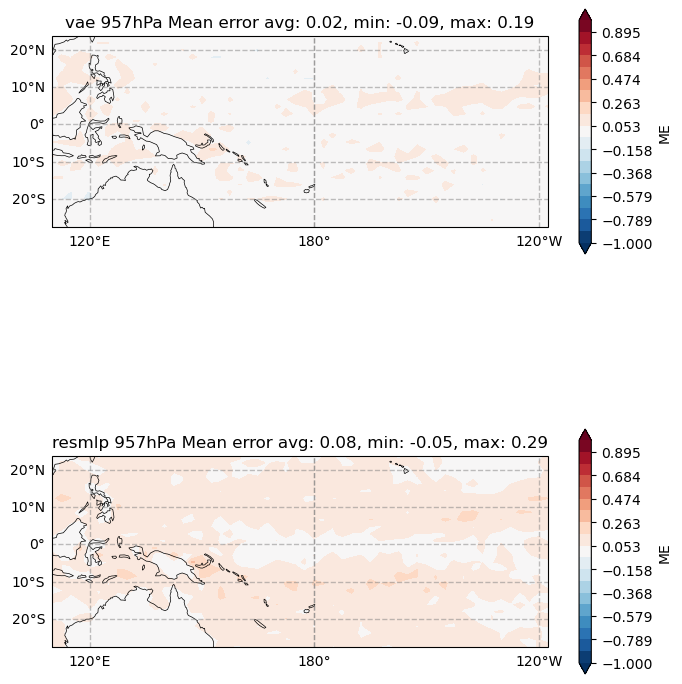

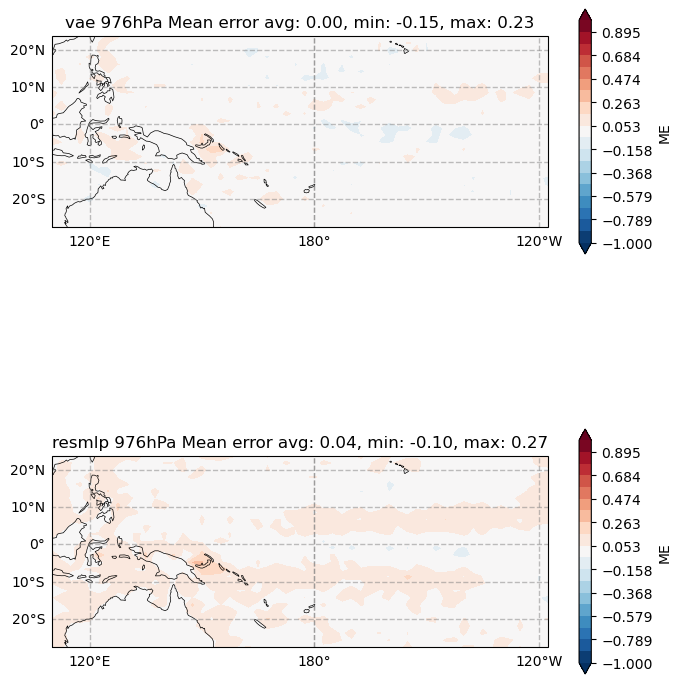

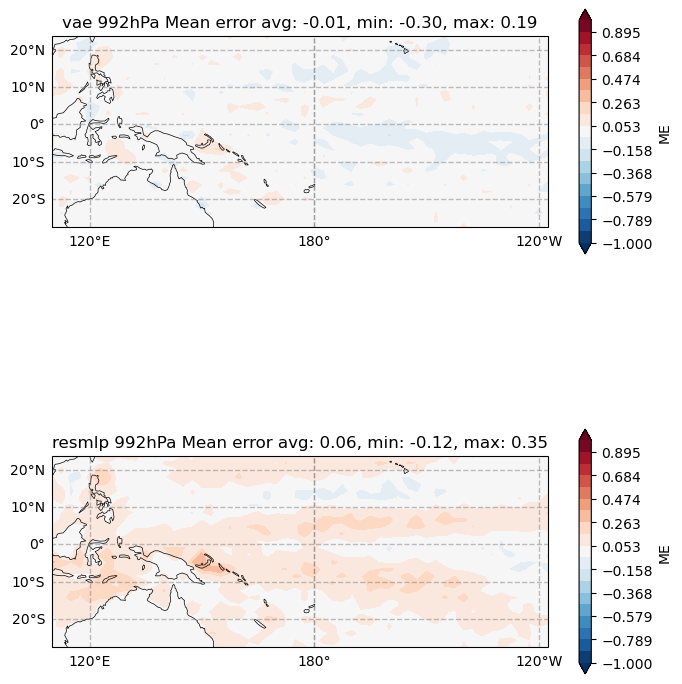

In [87]:
for i in range(30):
    fig, axes = plt.subplots(2,1, figsize=(8,10), subplot_kw={'projection':ccrs.PlateCarree(central_longitude=180)})
    me_vae = np.zeros((mask.shape))
    me_vae[mask.astype(bool)] = spatial_vae_metrics["me"][:,i]
    axes[0].set_title(f"vae {levs[i]}hPa Mean error avg: {np.mean(me_vae[mask.astype(bool)]):.2f}, min: {np.min(me_vae[mask.astype(bool)]):.2f}, max: {np.max(me_vae[mask.astype(bool)]):.2f}")
    plot_spatial(lon[min_y:max_y], lat[min_x:max_x], me_vae[min_x:max_x, min_y:max_y], ax=axes[0], cbar_label="ME", vmin=-1, vmax=1, cmap="RdBu_r")
    me_resmlp = np.zeros((mask.shape))
    me_resmlp[mask.astype(bool)] = spatial_resmlp_metrics["me"][:,i]
    axes[1].set_title(f"resmlp {levs[i]}hPa Mean error avg: {np.mean(me_resmlp[mask.astype(bool)]):.2f}, min: {np.min(me_resmlp[mask.astype(bool)]):.2f}, max: {np.max(me_resmlp[mask.astype(bool)]):.2f}")
    plot_spatial(lon[min_y:max_y], lat[min_x:max_x], me_resmlp[min_x:max_x,min_y:max_y], ax=axes[1], cbar_label="ME", vmin=-1, vmax=1, cmap="RdBu_r")
    plt.show()

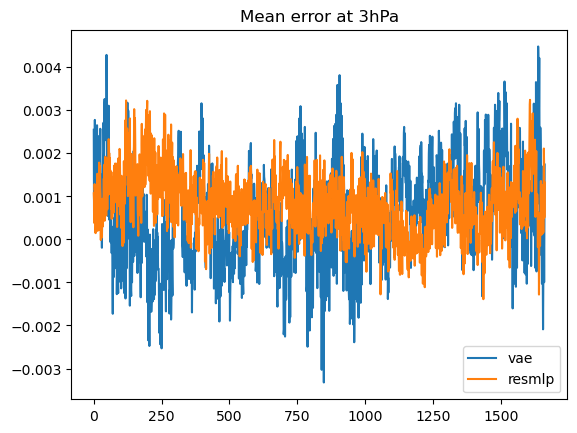

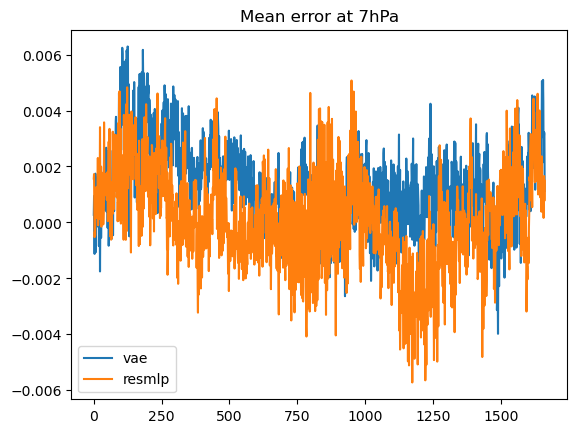

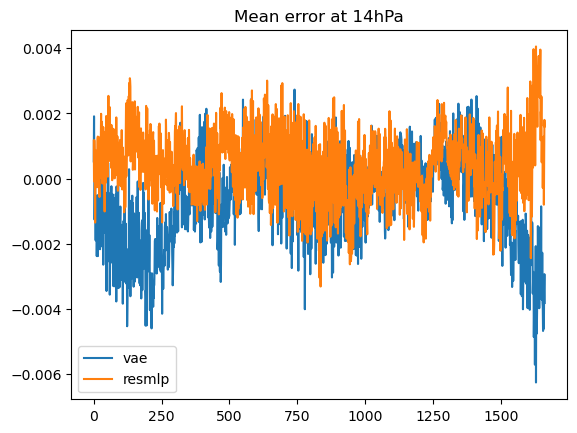

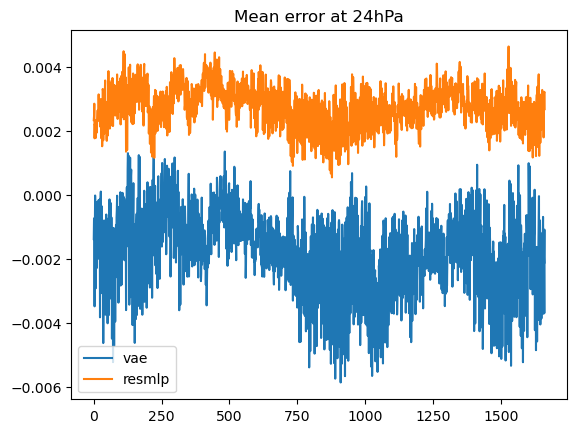

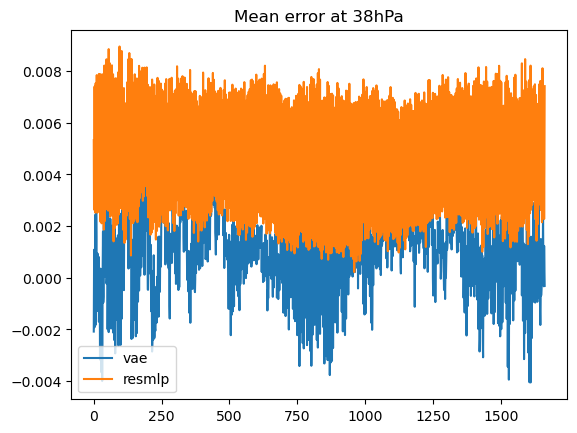

...

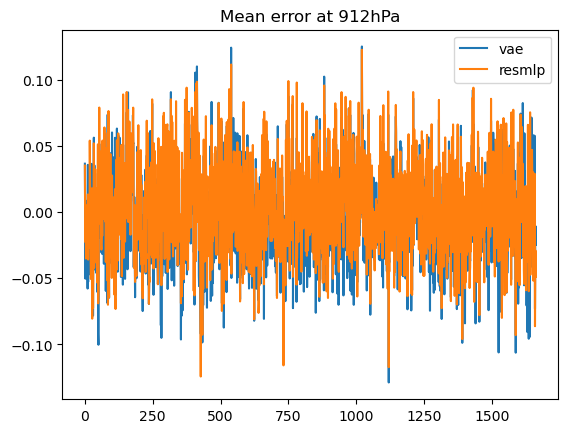

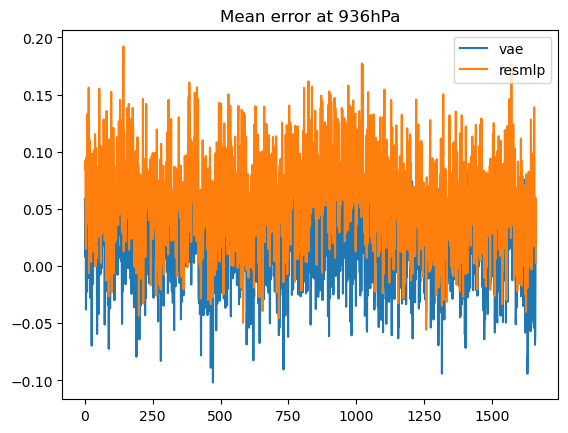

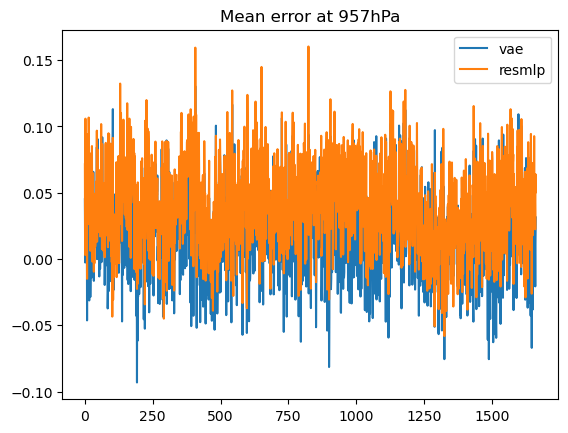

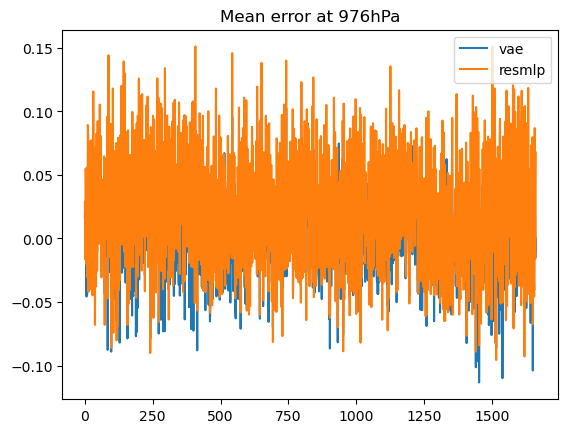

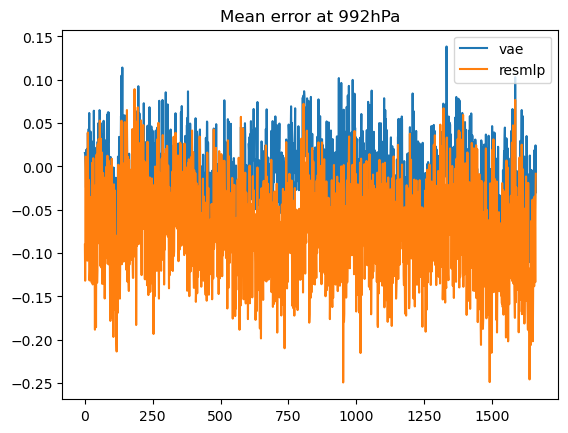

In [174]:
for lvl in range(30):
    plt.plot(time_vae_metrics["me"][:,lvl], label="vae")
    plt.plot(time_resmlp2_metrics["me"][:,lvl], label="resmlp")
    plt.title(f"Mean error at {levs[lvl]}hPa")
    plt.legend()
    plt.show()

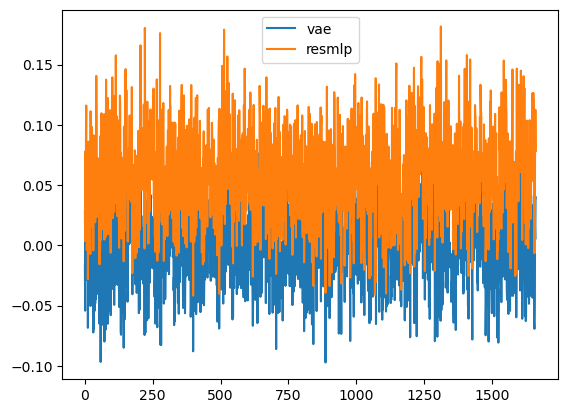

In [157]:
plt.plot(time_vae_metrics["me"][:,23], label="vae")
plt.plot(time_resmlp_metrics["me"][:,23], label="resmlp")
plt.legend()

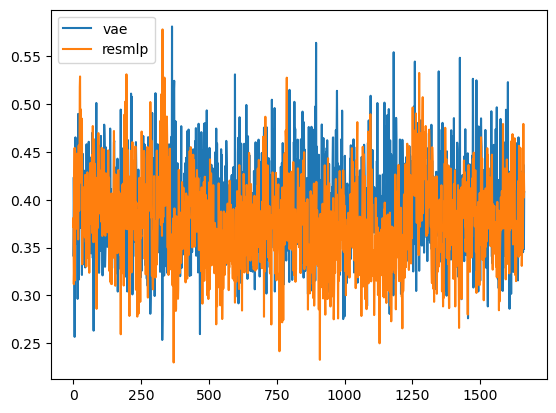

In [146]:
plt.plot(time_vae_metrics["r2"][:,23], label="vae")
plt.plot(time_resmlp_metrics["r2"][:,23], label="resmlp")
plt.legend()

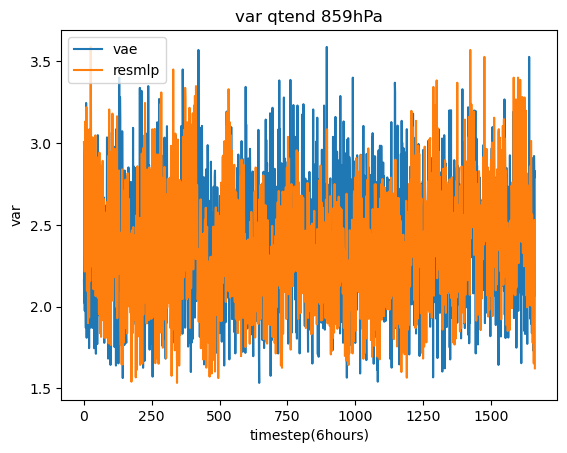

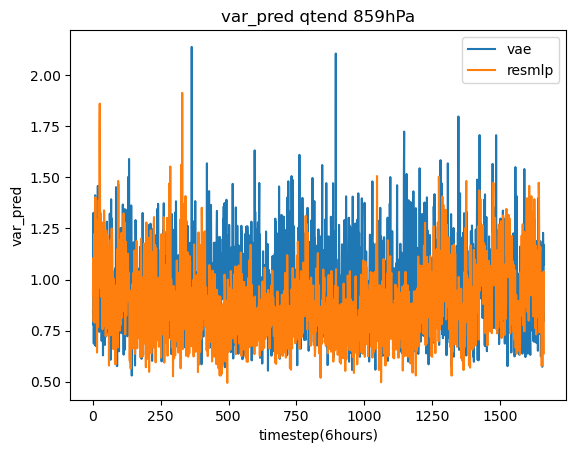

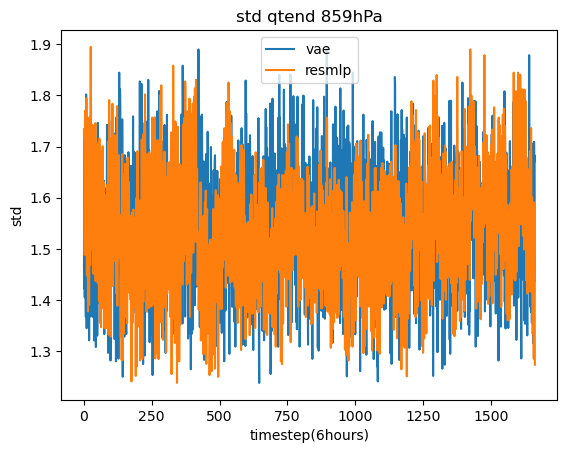

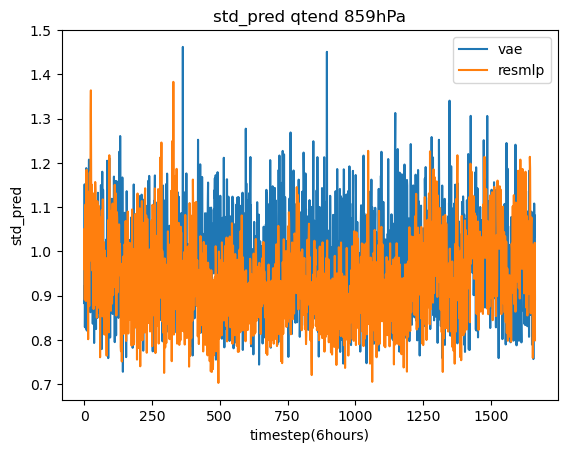

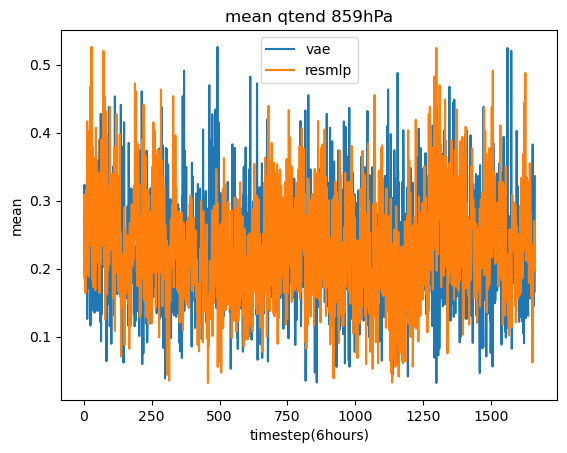

...

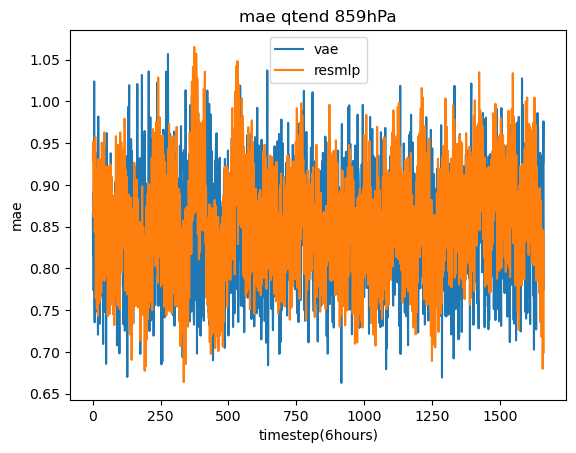

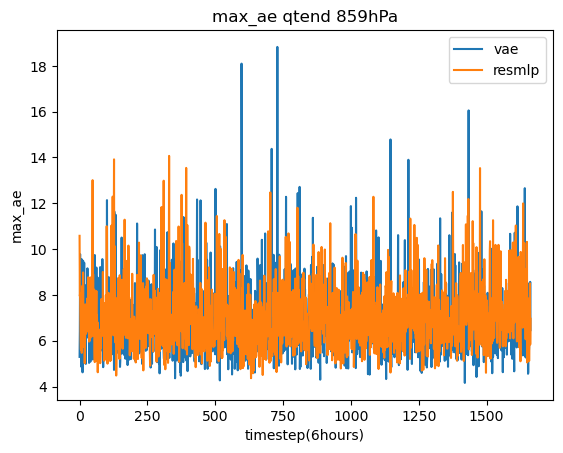

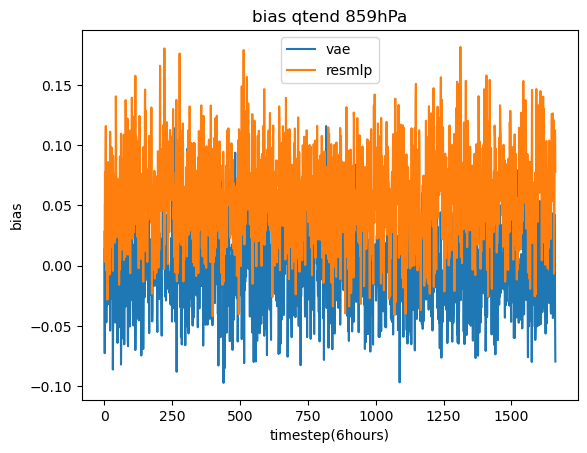

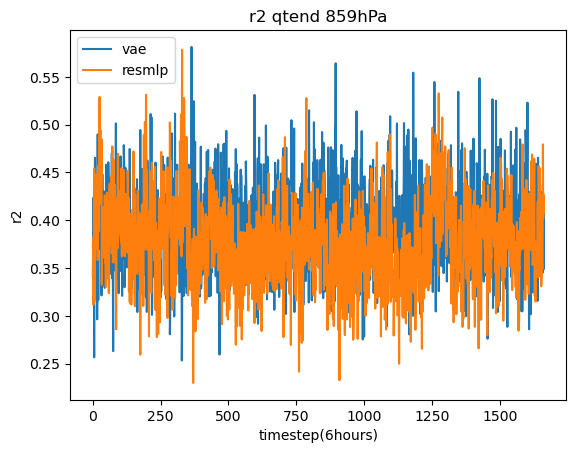

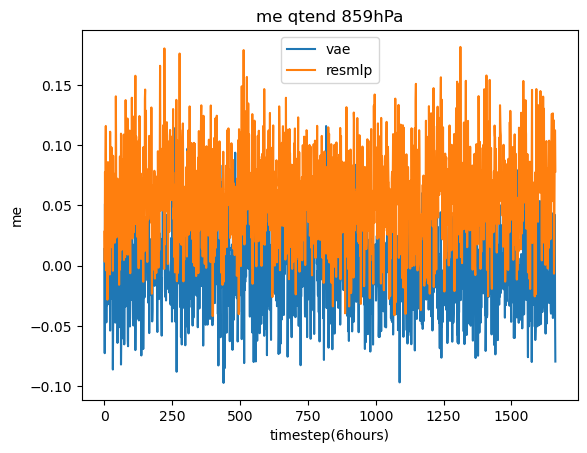

In [148]:
lvl = 23
for key in time_vae_metrics.keys():
    plt.title(f"{key} qtend {levs[lvl]}hPa")
    plt.plot(time_vae_metrics[key][:,lvl], label="vae")
    plt.plot(time_resmlp_metrics[key][:,lvl], label="resmlp")
    plt.legend()
    plt.ylabel(key)
    plt.xlabel("timestep(6hours)")
    plt.show()

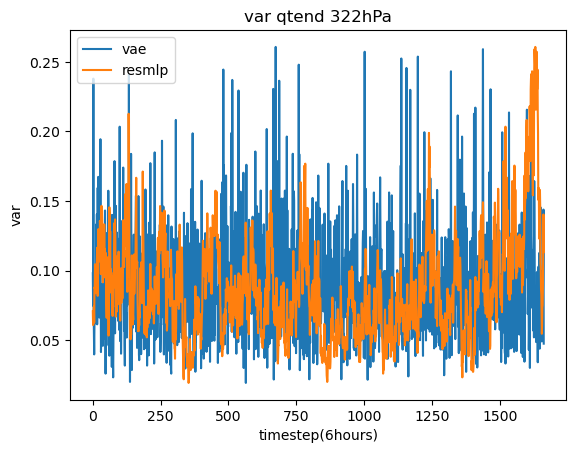

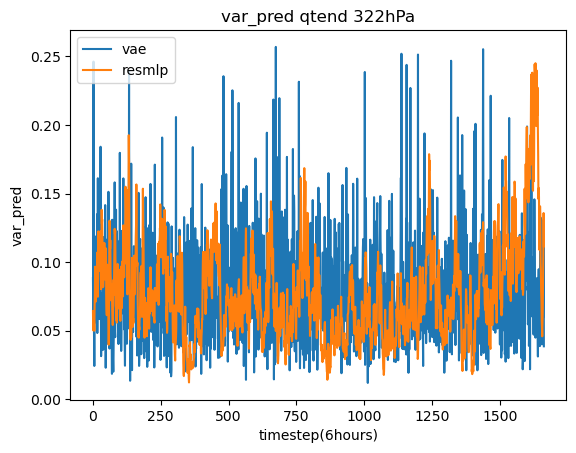

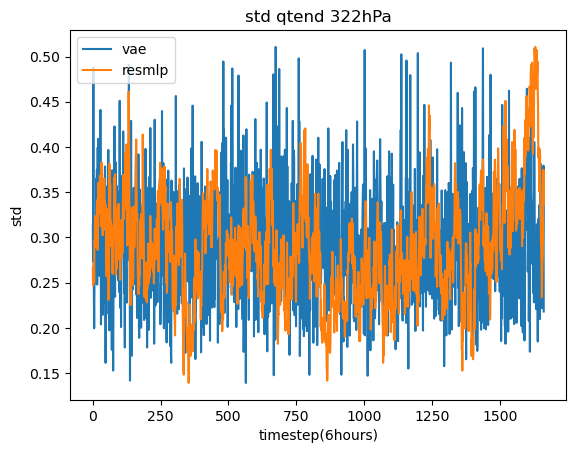

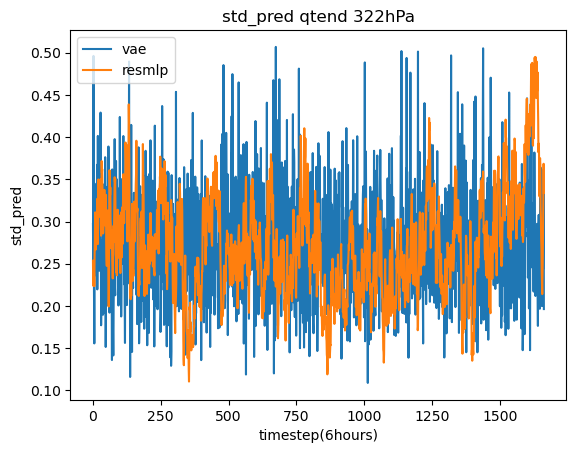

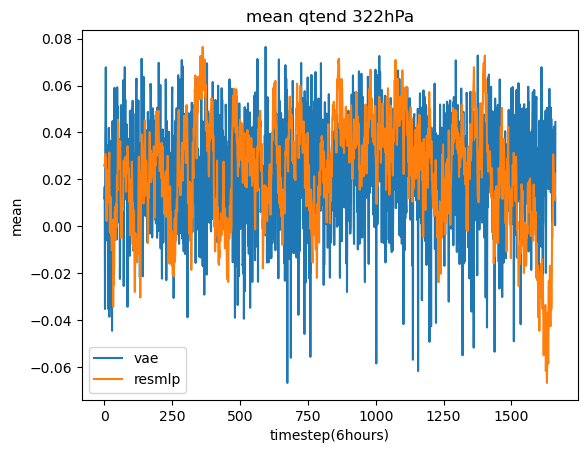

...

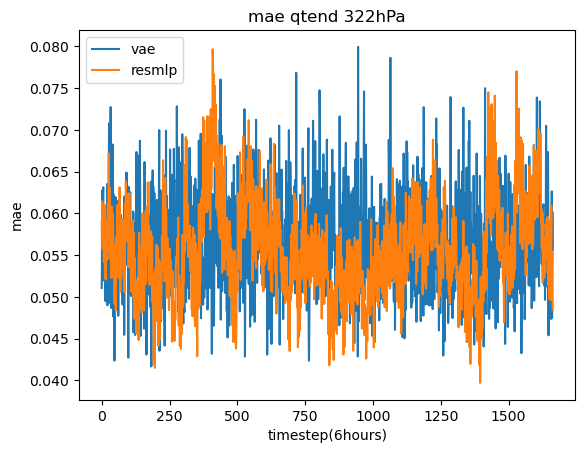

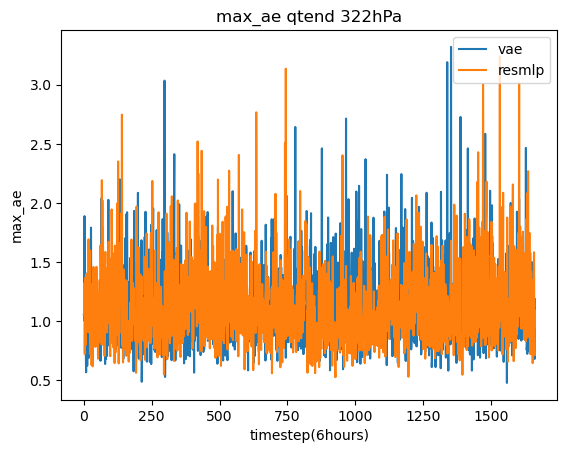

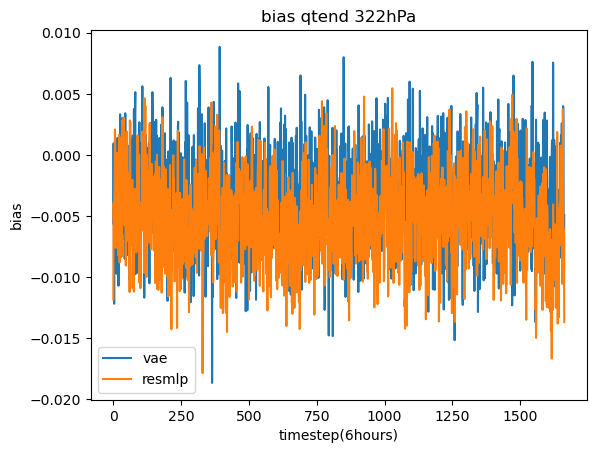

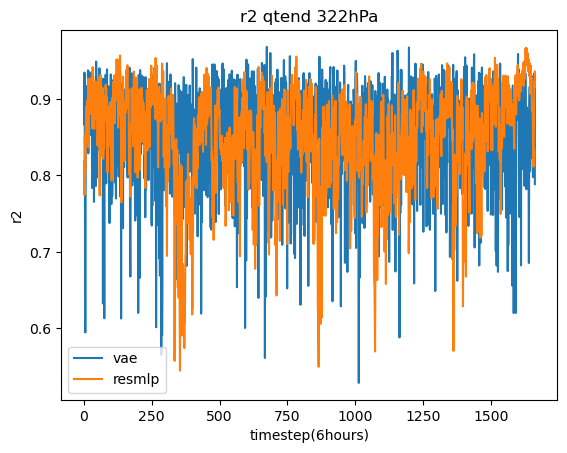

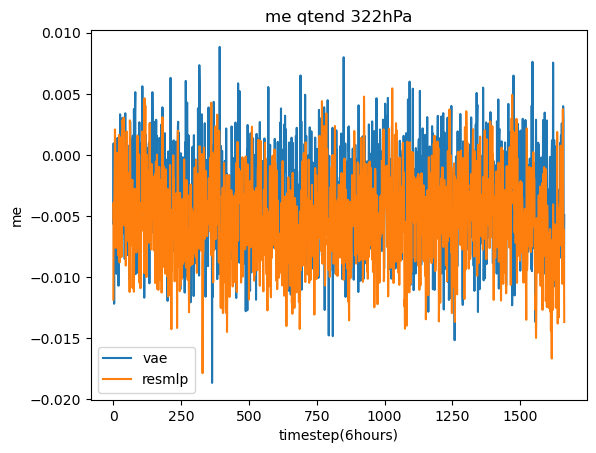

In [149]:
lvl = 15
for key in time_vae_metrics.keys():
    plt.title(f"{key} qtend {levs[lvl]}hPa")
    plt.plot(time_vae_metrics[key][:,lvl], label="vae")
    plt.plot(time_resmlp_metrics[key][:,lvl], label="resmlp")
    plt.legend()
    plt.ylabel(key)
    plt.xlabel("timestep(6hours)")
    plt.show()

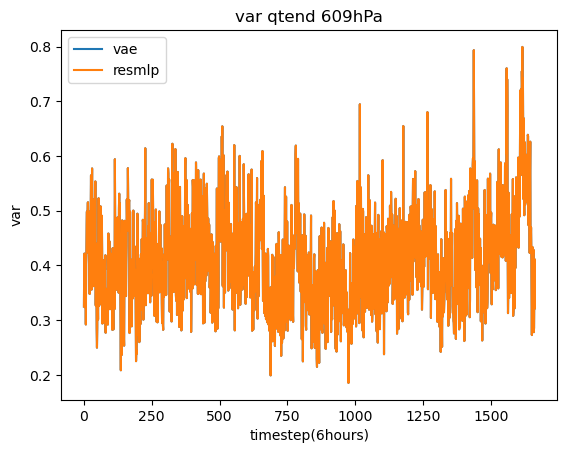

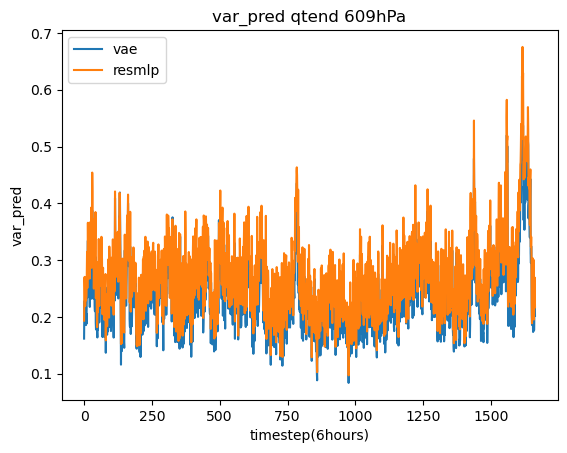

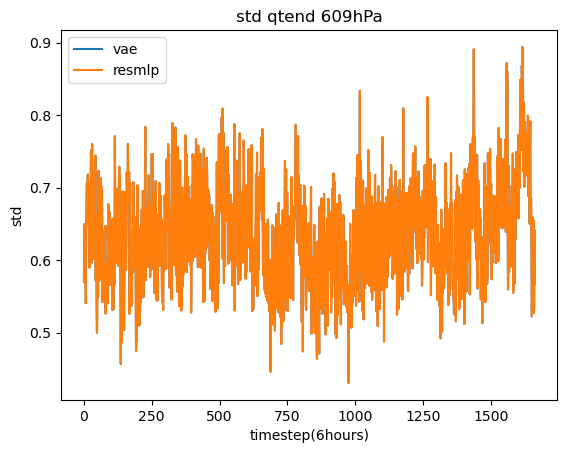

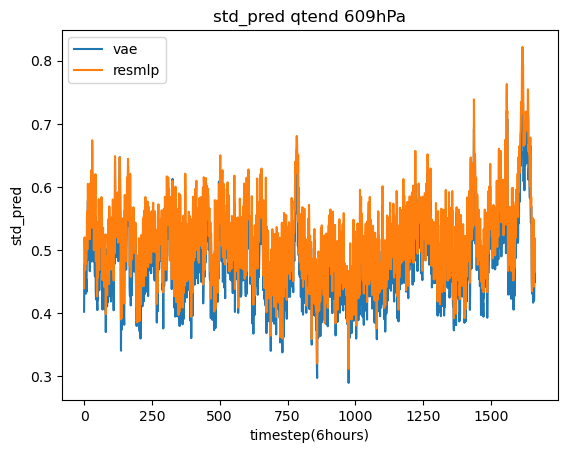

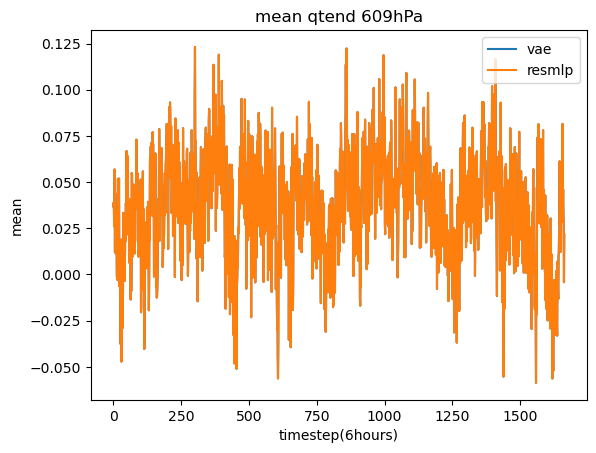

...

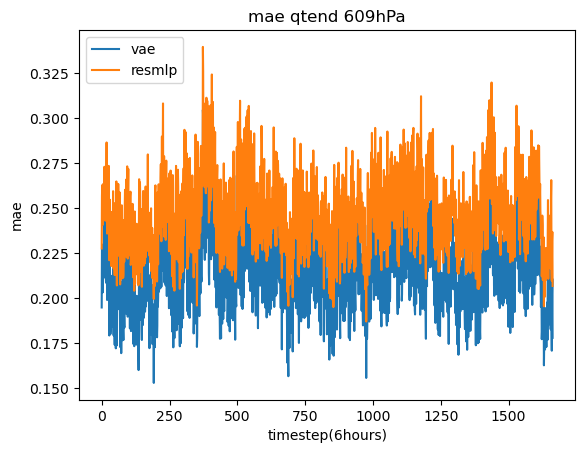

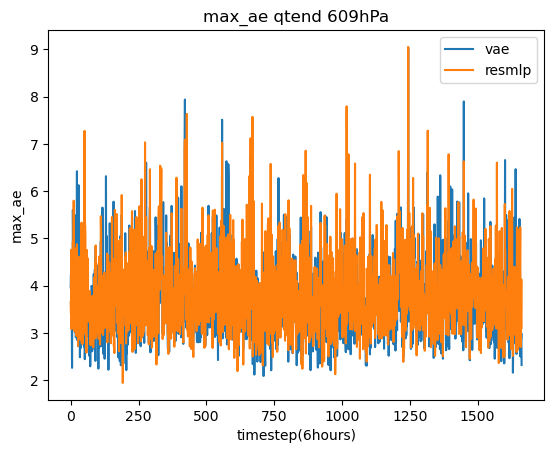

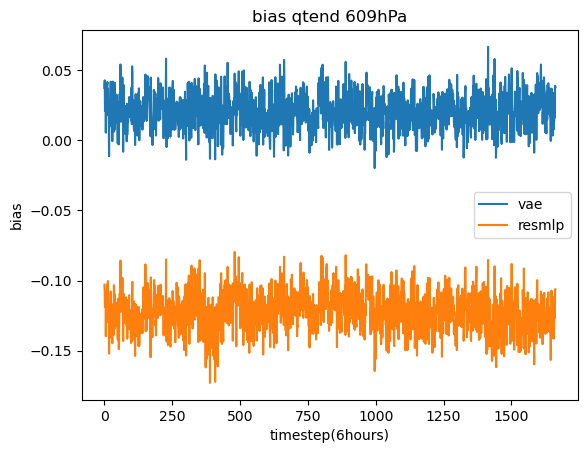

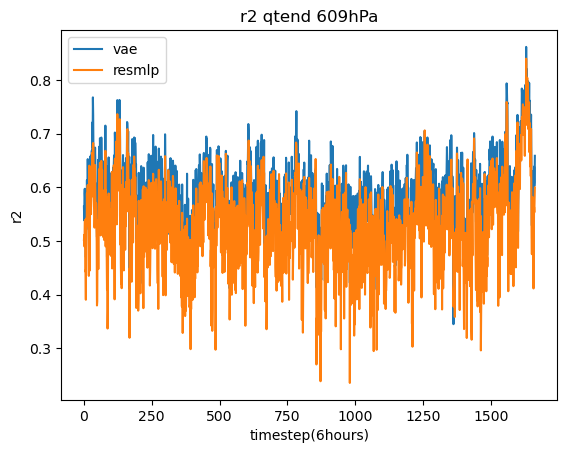

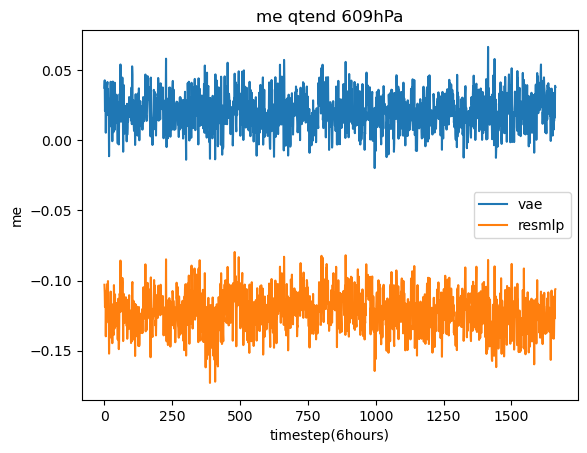

In [158]:
lvl = 19
for key in time_vae_metrics.keys():
    plt.title(f"{key} qtend {levs[lvl]}hPa")
    plt.plot(time_vae_metrics[key][:,lvl], label="vae")
    plt.plot(time_resmlp_metrics[key][:,lvl], label="resmlp")
    plt.legend()
    plt.ylabel(key)
    plt.xlabel("timestep(6hours)")
    plt.show()

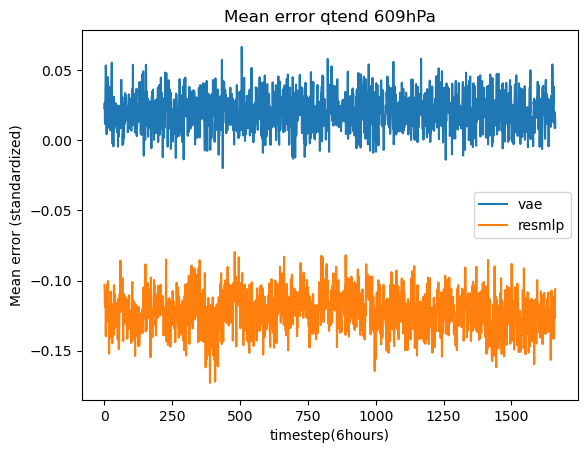

In [154]:
lvl = 19
key = "me"
plt.title(f"Mean error qtend {levs[lvl]}hPa")
plt.plot(time_vae_metrics[key][:,lvl], label="vae")
plt.plot(time_resmlp_metrics[key][:,lvl], label="resmlp")
plt.legend()
plt.ylabel(f"Mean error (standardized)")
plt.xlabel("timestep(6hours)")
plt.show()

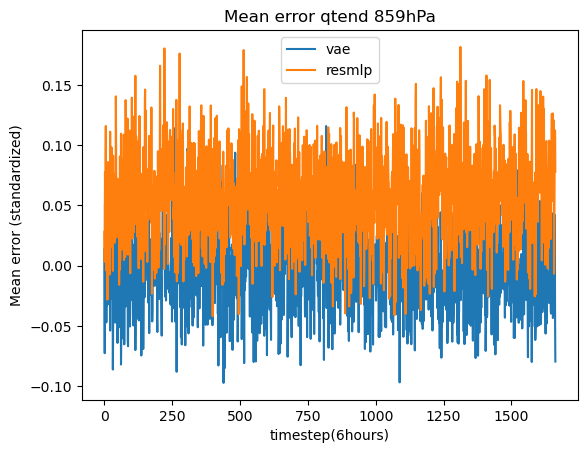

In [155]:
lvl = 23
key = "me"
plt.title(f"Mean error qtend {levs[lvl]}hPa")
plt.plot(time_vae_metrics[key][:,lvl], label="vae")
plt.plot(time_resmlp_metrics[key][:,lvl], label="resmlp")
plt.legend()
plt.ylabel(f"Mean error (standardized)")
plt.xlabel("timestep(6hours)")
plt.show()

In [152]:
levs[19]

609